# From Seoul to the World: Market and Audio Trends in K-Pop

## Import Required Libraries and Modules

In [70]:
from google.cloud import bigquery
from google.auth import load_credentials_from_file
from google.cloud.bigquery import Client
import pandas as pd
import streamlit as st
import plotly.express as px
import plotly.graph_objects as go
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.io as pio
pio.renderers.default = "notebook"
%matplotlib inline 


## Data Loading and Cleaning

In [2]:
# Load BigQuery credentials and initialize client 
credentials, project_id = load_credentials_from_file('/Users/thyneminhtetaungaung/Music Project All file /service_account.json')

client = Client(
    project=project_id,
    credentials=credentials
)


In [3]:
# Function to load data from BigQuery table
def load_data(table):
    # Query to fetch all records from the specified table
    query = f"SELECT * FROM `da26-python.music_data.{table}`"
    load_job = client.query(query)
    return load_job.to_dataframe()


In [4]:
# Function to load multiple data sources 
def load_and_merge_data():
    #Load all dataframes
    audio_features = load_data("audio_features")
    chart_positions = load_data("chart_positions")
    artists = load_data("artists")
    tracks = load_data("tracks")
    tracks_artists = load_data("tracks_artists_mapping")
    market_data = pd.read_csv("market2.csv")
    return audio_features, chart_positions, artists, tracks, tracks_artists, market_data

In [6]:
# Load and merge all data sources 
audio_features, chart_positions, artists, tracks, tracks_artists, market_data = load_and_merge_data()

In [7]:
# Checking the Market Data first since it was retrieved using the Spotify API.
market_data.info

<bound method DataFrame.info of        Unnamed: 0                track_id  \
0               0  5CMVGP24paZIukljDj0iWc   
1               1  25leEEaz1gIpp7o21Fqyjo   
2               2  1dtIaSlyrLI04sqYa8nLyN   
3               3  4PS1e8f2LvuTFgUs1Cn3ON   
4               4  5ASM6Qjiav2xPe7gRkQMsQ   
...           ...                     ...   
10778       10778  5sRczgK1xkskY6HICpEKHa   
10779       10779  21SiVKUZKwWmL5C64G3R3e   
10780       10780  4nQLt9m4p0fLUMOogvV6ZN   
10781       10781  4M7DbskLseolYL7rooP1SN   
10782       10782  2SMyu6hdDHWbLLXB76Oz4i   

                                        available_market  
0      AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,D...  
1      AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,D...  
2      AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,D...  
3      AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,D...  
4      AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,D...  
...                                                  ...  
10778  AR,AU,A

### Data Cleaning

## Exploratory Data Analysis (EDA)

### Domenient artist in korea market

In [ ]:
# Display the filtered rows
# Check if 'KR' is present in any row of the available_market column
contains_kr = market_data['available_market'].str.contains('KR', na=False).any()
if contains_kr:
    print("'KR' is present in the available_market column.")
else:
    print("'KR' is not present in the available_market column.")

In [20]:
# Filter rows where 'KR' is present in the available_market column
korean_tracks = market_data[market_data['available_market'].str.split(',').apply(lambda x: 'KR' in x if isinstance(x, list) else False)]

'KR' is present in the available_market column.


In [21]:
korean_tracks = market[market['available_market'].str.contains('KR', na=False)]
unique_markets = korean_tracks['available_market'].unique()
print(unique_markets)

['AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,DE,EC,EE,SV,FI,FR,GR,GT,HN,HK,HU,IS,IE,IT,LV,LT,LU,MY,MT,MX,NL,NZ,NI,NO,PA,PY,PE,PH,PL,PT,SG,SK,ES,SE,CH,TW,TR,UY,US,GB,AD,LI,MC,ID,JP,TH,VN,RO,IL,ZA,SA,AE,BH,QA,OM,KW,EG,MA,DZ,TN,LB,JO,PS,IN,BY,KZ,MD,UA,AL,BA,HR,ME,MK,RS,SI,KR,BD,PK,LK,GH,KE,NG,TZ,UG,AG,AM,BS,BB,BZ,BT,BW,BF,CV,CW,DM,FJ,GM,GE,GD,GW,GY,HT,JM,KI,LS,LR,MW,MV,ML,MH,FM,NA,NR,NE,PW,PG,PR,WS,SM,ST,SN,SC,SL,SB,KN,LC,VC,SR,TL,TO,TT,TV,VU,AZ,BN,BI,KH,CM,TD,KM,GQ,SZ,GA,GN,KG,LA,MO,MR,MN,NP,RW,TG,UZ,ZW,BJ,MG,MU,MZ,AO,CI,DJ,ZM,CD,CG,IQ,LY,TJ,VE,ET,XK'
 'AR,AU,AT,BE,BO,BR,BG,CA,CL,CO,CR,CY,CZ,DK,DO,DE,EC,EE,SV,FI,FR,GR,GT,HN,HK,HU,IS,IE,IT,LV,LT,LU,MY,MT,MX,NL,NZ,NI,NO,PA,PY,PE,PH,PL,PT,SG,SK,ES,SE,CH,TW,TR,UY,US,GB,AD,LI,MC,ID,JP,TH,VN,RO,IL,ZA,SA,AE,BH,QA,OM,KW,EG,MA,DZ,TN,LB,JO,PS,IN,BY,KZ,MD,UA,AL,BA,HR,ME,MK,RS,SI,KR,BD,PK,LK,GH,KE,NG,TZ,UG,AG,AM,BS,BB,BZ,BT,BW,BF,CV,CW,DM,FJ,GM,GE,GD,GW,GY,HT,JM,KI,LS,LR,MW,MV,ML,MH,FM,NA,NR,NE,PW,PG,WS,SM,ST,SN,SC,SL,SB,KN,LC,VC,SR,TL,TO,TT,TV,VU

# Dominent Artist by Available Market

In [81]:
import pandas as pd

# Function to get dominant artists by available market and chart year
def get_dominant_artists_by_market_and_year(market_code, chart_year):
    # Step 1: Filter tracks available in the given market
    filtered_tracks = market[market['available_market'].str.contains(market_code, na=False)]
    
    # Step 2: Merge with df_chart_positions to filter by chart year
    # Convert chart_week to datetime (if it's not already)
    df_chart_positions['chart_week'] = pd.to_datetime(df_chart_positions['chart_week'], errors='coerce')

    # Extract year from chart_week
    df_chart_positions['year'] = df_chart_positions['chart_week'].dt.year

    # Filter chart positions by the specified year
    chart_positions_in_year = df_chart_positions[df_chart_positions['year'] == chart_year]
    
    # Step 3: Merge filtered chart positions with market data on track_id
    tracks_in_market = chart_positions_in_year.merge(filtered_tracks, on='track_id', how='inner')
    
    # Step 4: Merge with df_tracks_artists_mapping to get artist information
    tracks_with_artists = tracks_in_market.merge(df_tracks_artists_mapping, on='track_id', how='inner')

    # Step 5: Merge with df_artists to get artist details
    artists_data = tracks_with_artists.merge(df_artists, on='artist_id', how='inner')

    # Step 6: Group and analyze to get the dominant artists based on the number of tracks
    dominant_artists = artists_data.groupby(['artist_id', 'name']).agg({
        'track_id': 'count',  # Number of tracks
        'popularity': 'mean',  # Average popularity
        'followers': 'mean'    # Average followers
    }).reset_index().sort_values(by='track_id', ascending=False)
    
    # Step 7: Return the top artists
    return dominant_artists.head(10)

# Example usage
market_code = 'US'  # Specify the market code (e.g., 'KR' for Korea)
chart_year = 2023   # Specify the chart year you're interested in
top_artists = get_dominant_artists_by_market_and_year(market_code, chart_year)

# Display the result
print(f"Top Artists in {market_code} for {chart_year}:")
print(top_artists)


Top Artists in US for 2023:
                  artist_id           name  track_id  popularity    followers
238  4oUHIQIBe0LHzYfvXNW4QM  Morgan Wallen       377        91.0   10845945.0
2    06HL4z0CvFAxyc27GXpf02   Taylor Swift       231       100.0  123544806.0
43   12GqGscKJx3aE4t07u7eVZ     Peso Pluma       224        93.0   16616208.0
384  7tYKF4w9nC0nq9CsPZTHyP            SZA       221        90.0   23627089.0
178  3TVXtAsR1Inumwj472S9r4          Drake       207        96.0   92537455.0
78   1URnnhqYAYcrqrcwql10ft      21 Savage       171        89.0   20281743.0
198  40ZNYROS4zLfyyBSs2PGe2     Zach Bryan       152        91.0    5274397.0
23   0Y5tJX1MQlPlqiwlOH1tJY   Travis Scott       124        94.0   33611357.0
240  4q3ewBCX7sLwd24euuV69X      Bad Bunny       124        95.0   86231149.0
354  718COspgdWOnwOFpJHRZHS     Luke Combs       121        88.0   11525460.0


C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\3588776951.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_chart_positions['chart_week'] = pd.to_datetime(df_chart_positions['chart_week'], errors='coerce')
C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\3588776951.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_chart_positions['year'] = df_chart_positions['chart_week'].dt.year


In [77]:
import pandas as pd

# Example: Adding a 'chart_date' column (if you have it in your dataset)
# Let's assume 'chart_date' is the column representing the chart's date.
# Make sure it's in datetime format before working with it.
market['chart_date'] = pd.to_datetime(market['chart_date'], errors='coerce')

# Function to get dominant artists for a specific market code and chart year
def get_dominant_artists_by_year_and_week(market_code, chart_year, target_date='2022-02-19'):
    # Step 1: Convert the target date to datetime and get the corresponding week and year
    target_date = pd.to_datetime(target_date)
    target_week = target_date.week  # Get the week number from the target date
    
    # Step 2: Filter tracks available in the given market
    filtered_tracks = market[market['available_market'].str.contains(market_code, na=False)]
    
    # Step 3: Join with Tracks-Artists Mapping
    tracks_with_artists = filtered_tracks.merge(df_tracks_artists_mapping, on='track_id', how='inner')
    
    # Step 4: Join with Artists Dataset
    artists_data = tracks_with_artists.merge(df_artists, on='artist_id', how='inner')
    
    # Step 5: Filter data by target year and week
    artists_data_filtered = artists_data[(artists_data['chart_date'].dt.year == chart_year) & 
                                         (artists_data['chart_date'].dt.week == target_week)]
    
    # Step 6: Group and Analyze
    dominant_artists = artists_data_filtered.groupby(['artist_id', 'name']).agg({
        'track_id': 'count',  # Number of tracks
        'popularity': 'mean',  # Average popularity
        'followers': 'mean'    # Average followers
    }).reset_index().sort_values(by='track_id', ascending=False)
    
    # Step 7: Return the top artists
    return dominant_artists.head(10)

# Example: Get top US artists for the week containing 2022-02-19 and chart year 2024
market_code = 'US'  # You can change this to any other market code (e.g., 'US', 'GB', etc.)
chart_year = 2024  # Chart year passed as an argument
top_artists = get_dominant_artists_by_year_and_week(market_code, chart_year)

# Display the top artists
print(f"Top Artists in {market_code} for the week containing 2022-02-19 in {chart_year}:")
print(top_artists)


KeyError: 'chart_date'

In [74]:
# Get unique names in the 'name' column and sort them alphabetically
unique_names = sorted(korean_artists['name'].unique())

# Print all the unique names
for name in unique_names:
    print(name)

"Weird Al" Yankovic
#1 Tribute Band
$NOT
$uicideboy$
*NSYNC
070 Shake
112
1990's Karaoke Band
2 Chainz
2 Pistols
2000's Karaoke Band
2000s Karaoke Band
2010s Karaoke Band
2017 DJ Mo Fleeks
21 Savage
24kGoldn
2CELLOS
2Pac
2Rare
2gether
3 Doors Down
3 Dope Brothas
310babii
311
347aidan
3LAU
3LW
3OH!3
4*TOWN (From Disney and Pixar’s Turning Red)
41
42 Dugg
4batz
5 Seconds of Summer
50 Cent
504 Boyz
6LACK
6ix9ine
7 Aurelius
702
7KINGIN
8-Bit Arcade
80's-90's MTV Rock Hits
80-90's Top Rock Hits
90's 80's Rock Hits
98º
99 Percent
9lokknine
A Boogie Wit da Hoodie
A Day To Remember
A Great Big World
A Perfect Circle
A Rocket To The Moon
A Touch Of Class
A Tribe Called Quest
A$AP Ferg
A$AP Rocky
A*Teens
A-Trak
A.B. Quintanilla III Y Los Kumbia Kings
A.R. Rahman
A7S
ACRAZE
AFI
AFROJACK
AFSHEEN
AG aka The Voice of Harlem
AJR
ARIZONATEARS
ATR Son Son
AURORA
AWOLNATION
Aaliyah
Aaries
Aaron Carter
Aaron Lewis
Aaron Lines
Aaron Tippin
Ab-Soul
Academy of St. Martin in the Fields
Ace Hood
Action Bronso

### K-Pop Dominant Artists by Popularity

to identify which Korean music bands dominate global charts based on their popularity metrics. This analysis will focus on ranking bands and providing actionable insights into their market impact.



In [12]:
# # Merge datasets to associate artists with their chart positions and popularity
artist_chart_data = (
    chart_positions
    .merge(tracks_artists, on='track_id')
    .merge(artists, on='artist_id')
)

In [48]:
# Sort artists by popularity in descending order and select relevant columns 
sorted_artists = artist_chart_data.sort_values(by='popularity', ascending=False)[['name', 'popularity']]
# Remove duplicate artist names to avoid redundancy
unique_sorted_artists = sorted_artists.drop_duplicates(subset='name')
# Set the display options to show more rows
pd.set_option('display.max_rows', None)  # This will allow displaying all rows
pd.set_option('display.max_columns', None) 
unique_sorted_artists.reset_index()



,index,name,popularity
0,127217,Taylor Swift,100
1,23510,Drake,96
2,8979,The Weeknd,96
3,173693,Billie Eilish,96
4,67488,Bad Bunny,95
5,78791,Sabrina Carpenter,95
6,160836,Bruno Mars,94
7,48822,Travis Scott,94
8,170052,Kanye West,93
9,48227,Future,93


In [60]:
# filter the dataset for a predefined list of bands and its members (e.g., BTS, Blackpink, Jimin).
artists_to_check = ['Jin',"Jimin","Jung Kook", 'RM', 'BTS',"Agust D","Minji", "Hanni", "Danielle", "Haerin", "Hyein",'Stray Kids',"j-hope", "JENNIE", "LISA", "ROSÉ", 
                    "NewJeans", "BLACKPINK","Bang Chan", "Lee Know", "Changbin", "Hyunjin", "Han", "Felix", "Seungmin", "I.N", "jisoo","TWICE","IU"]

# Filter the DataFrame to show only the rows where 'name' is in the specified list
filtered_artists = unique_sorted_artists[unique_sorted_artists['name'].isin(artists_to_check)]

# # Display the filtered results
print(filtered_artists)

              name  popularity
115280       Jimin          89
101973         BTS          87
174099   Jung Kook          87
119906  Stray Kids          85
170597        LISA          82
86555     NewJeans          82
21159    BLACKPINK          81
161392      JENNIE          80
43096        TWICE          79
58302           RM          78
102670     Agust D          77
163205      j-hope          73
63932         ROSÉ          64


In [24]:
# Aggregating Artists by Popularity
# group artists by their popularity, count how many artists share the same popularity score, and concatenate their names. 

# Assuming artist_chart_data is your DataFrame/ Sort the data by popularity and select only relevant columns
sorted_artists = artist_chart_data[['name', 'popularity']]

# Group by popularity to count artists and concatenate their names
grouped_artists = sorted_artists.groupby('popularity').agg(
    artist_names=('name', lambda x: ', '.join(x.unique())),
    artist_count=('name', 'size')
).reset_index()

# Sort the data by popularity (descending)
grouped_artists = grouped_artists.sort_values(by='popularity', ascending=False)

# Add rank column based on popularity
grouped_artists['rank'] = grouped_artists['popularity'].rank(ascending=False, method='min')

# Display the grouped results
grouped_artists

,popularity,artist_names,artist_count,rank
97,100,Taylor Swift,1807,1.0
96,96,"The Weeknd, Drake, Billie Eilish",4687,2.0
95,95,"Bad Bunny, Sabrina Carpenter",947,3.0
94,94,"Bruno Mars, Travis Scott",1503,4.0
93,93,"Future, Peso Pluma, Kanye West, Eminem",3054,5.0
92,92,"Post Malone, Ariana Grande, Kendrick Lamar, Co...",4870,6.0
91,91,"Justin Bieber, Zach Bryan, Morgan Wallen, Juni...",2254,7.0
90,90,"Rauw Alejandro, SZA, Metro Boomin, Playboi Car...",1667,8.0
89,89,"XXXTENTACION, 21 Savage, Charli xcx, Ed Sheera...",2911,9.0
88,88,"Chris Brown, Dua Lipa, Juice WRLD, Adele, J Ba...",4371,10.0


### Insights and Answer
General Insights
Top 5 Bands by Popularity (Within Global Chart Rank 30): BTS (87), Stray Kids (85), BLACKPINK (81), NewJeans (82), and TWICE (79).

Most Popular Members Across Bands:
Jimin (89) and Jung Kook (87) from BTS.
LISA (82) from BLACKPINK.

Band Dynamics:
BTS benefits from strong solo contributions.
BLACKPINK relies on standout members like LISA and JENNIE.
NewJeans and TWICE showcase collective appeal rather than individual dominance.


1. BTS is the top-ranked band with an overall popularity score of 87. Members Jimin (89) and Jung Kook (87) lead in individual popularity, with Jimin surpassing the band’s overall score. Other notable members include RM (78), Agust D (77), and j-hope (73). Their strong individual fanbases, boosted by successful solo releases like Jung Kook’s "Seven" and Jimin’s "Like Crazy," contribute significantly to BTS’s global dominance.

2. Stray Kids follows closely with a band popularity score of 85. While individual member scores are not highlighted in this dataset, their collective appeal stems from a strong fanbase, particularly in international markets. Leaders like Bang Chan and standout members such as Felix play pivotal roles in the group’s success.

3. BLACKPINK holds an overall score of 81, with LISA (82) leading among the members. LISA’s global recognition is driven by her solo projects and international collaborations. Other members like JENNIE (80) and ROSÉ (64) also contribute significantly to the group’s appeal, while Jisoo plays a stronger role in regional markets.

4. NewJeans is a rising force in the K-pop scene, scoring 82 as a group. Individual members like Minji, Hanni, Danielle, Haerin, and Hyein are not individually ranked, indicating their strength lies in collective branding. Their rapid ascent demonstrates their appeal among younger, global audiences.

5. TWICE With a popularity score of 79, TWICE maintains steady success as a group. While individual member scores are not listed, their balanced promotion strategy reflects their collective strength in the industry.


In [ ]:
artists_at_rank = grouped_artists[grouped_artists['rank'] == 87]
# Loop through the filtered rows 
for index, row in artists_at_rank.iterrows(): 
# Access the artist names and rank 
    artist_names = row['artist_names']
# Print the artist names for the specific rank 
    print(f"{artist_names}")

BTS (87) - South Korean.
Jung Kook(87)
Jimin (89) - South Korean, part of BTS.
Stray Kids (85) - South Korean group.


In [67]:
bts_data=artist_chart_data.loc[artist_chart_data.name=='BTS']
bts_data

,chart_week,list_position,track_id,artist_id,name,popularity,followers


In [68]:
unique_sorted_artists.loc[unique_sorted_artists.name=='Black Pink']

,name,popularity


In [25]:
bts_data.sort_values('list_position').head(5)

,chart_week,list_position,track_id,artist_id,name,popularity,followers
19901,2021-07-10,1,1mWdTewIgB3gtBM3TOSFhB,3Nrfpe0tUJi4K4DXYWgMUX,BTS,87,76212947
19905,2021-09-11,1,1mWdTewIgB3gtBM3TOSFhB,3Nrfpe0tUJi4K4DXYWgMUX,BTS,87,76212947
19904,2021-08-07,1,1mWdTewIgB3gtBM3TOSFhB,3Nrfpe0tUJi4K4DXYWgMUX,BTS,87,76212947
19903,2021-07-31,1,1mWdTewIgB3gtBM3TOSFhB,3Nrfpe0tUJi4K4DXYWgMUX,BTS,87,76212947
19902,2021-07-17,1,1mWdTewIgB3gtBM3TOSFhB,3Nrfpe0tUJi4K4DXYWgMUX,BTS,87,76212947


In [26]:
bts_data = df1[df1.index == 'BTS']

print(bts_data)

      total_chart_appearances  avg_chart_position
name                                             
BTS                        98           32.489796


In [27]:
dfbts=df1.loc['BTS',:]
dfbts

total_chart_appearances    98.000000
avg_chart_position         32.489796
Name: BTS, dtype: float64

In [28]:
df_artists

,artist_id,name,popularity,followers
0,13UwRaADQI0yTqjPBDkk6d,J-Shin (Featuring LaTocha Scott of Xscape),0,253
1,2LmsYeN3MzzZ9zhuZhNyqO,A*Teens,0,10
2,5Q25oFANw7zA3kD2DPaJ8D,The 2000s Karaoke Band,0,26
3,7u7ORV6MVjId1jfJwMdakL,2000s Karaoke Band,0,27
4,0LyfQWJT6nXafLPZqxe9Of,Various Artists,0,2542450
5,0sghswo09Y90G2q0eha4SW,Joe Osborne,0,23
6,14qvHyl1HApvsMrtxXljMM,Archuleta Maroon,0,21
7,1b9wvEcR1vuxoVu6isElSd,Anand Clique,0,109
8,5lfsewMdyn5f9okNcLUtYM,Xander Phillips,0,79
9,0o9FGMZT1bOTSGYFb7BoWz,Drop That Thun Thun,0,250


# 2. Comparison of Asia Artists

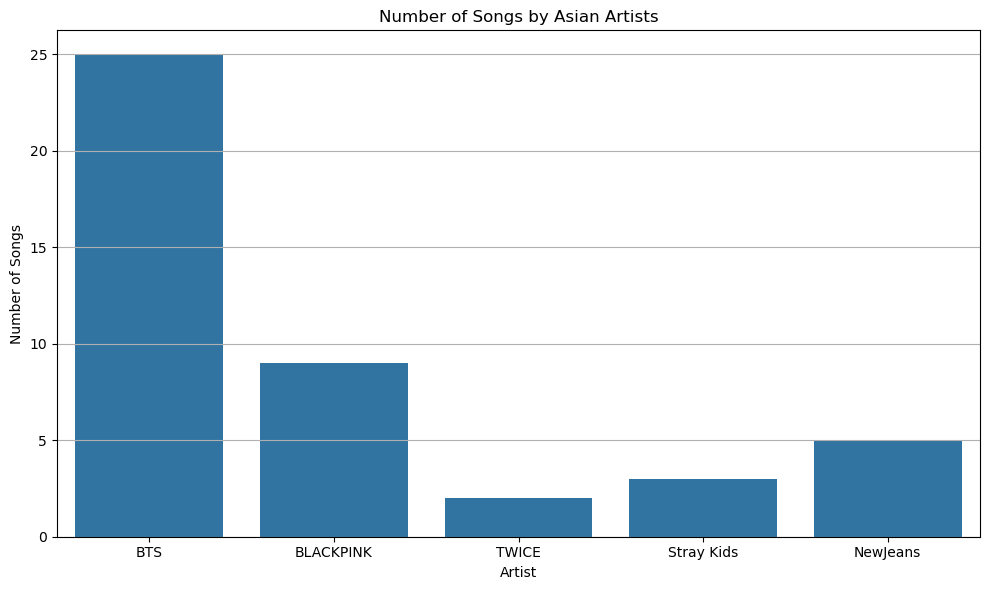

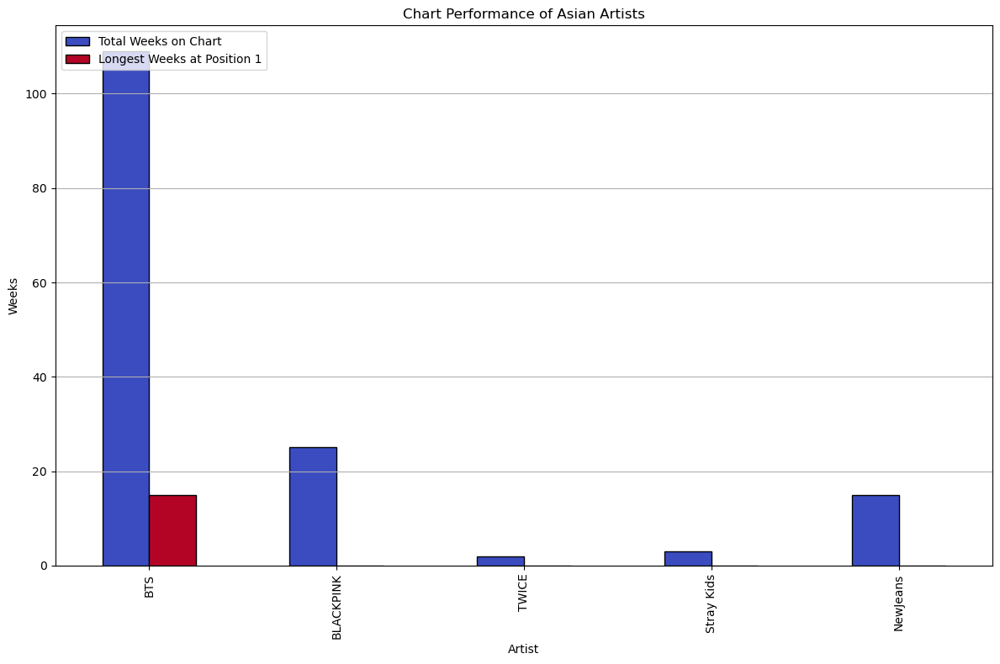

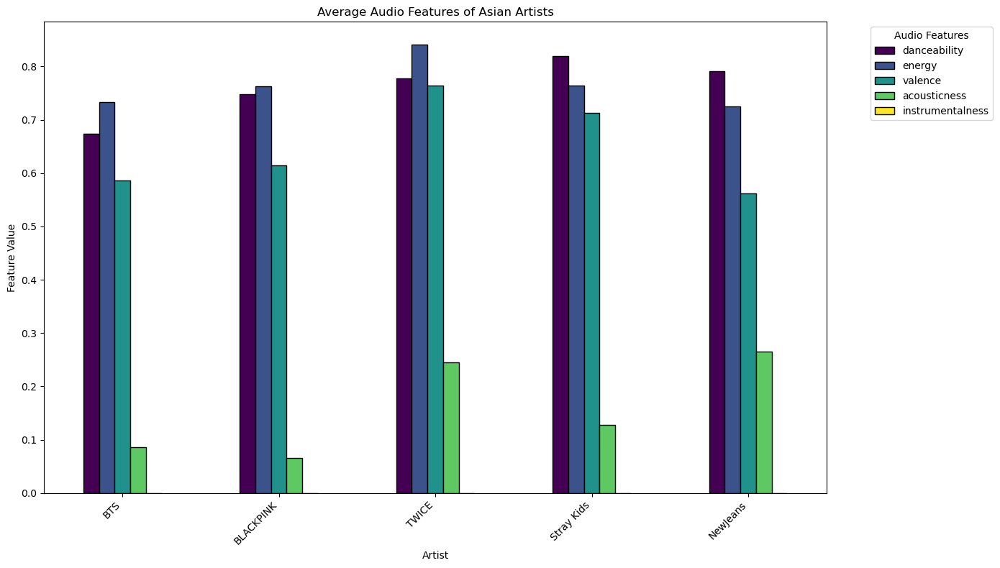

In [75]:
# Step 1: Filter data for Asian artists
asian_artists = ['BTS', "BLACKPINK", 'TWICE', 'Stray Kids',"NewJeans"]
asian_artist_data = artist_chart_data[artist_chart_data['name'].isin(asian_artists)]
audio_features_list = ['danceability', 'energy', 'valence', 'acousticness', 'instrumentalness']

# Step 2: Group by artist and calculate metrics
metrics = []

for artist in asian_artists:
    # Filter data for the artist
    artist_data = asian_artist_data[asian_artist_data['name'] == artist]
    
    # Number of songs
    num_songs = artist_data['track_id'].nunique()
    
    # Total weeks at chart positions
    total_weeks = artist_data['chart_week'].nunique()
    
    # Longest weeks at position 1
    longest_weeks_at_1 = artist_data[artist_data['list_position'] == 1]['chart_week'].nunique()
    
    # Average audio features
    artist_features = audio_features[audio_features['track_id'].isin(artist_data['track_id'])]
    avg_features = artist_features[audio_features_list].mean()
    
    # Combine metrics
    metrics.append({
        'artist': artist,
        'num_songs': num_songs,
        'total_weeks': total_weeks,
        'longest_weeks_at_1': longest_weeks_at_1,
        **avg_features
    })

# Convert metrics to a DataFrame
metrics_df = pd.DataFrame(metrics)

# Step 3: Visualization - Number of Songs and Chart Performance
# Bar chart for number of songs
plt.figure(figsize=(10, 6))
sns.barplot(data=metrics_df, x='artist', y='num_songs')
plt.title("Number of Songs by Asian Artists")
plt.xlabel("Artist")
plt.ylabel("Number of Songs")
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Bar chart for total weeks and longest weeks at position 1
metrics_df[['artist', 'total_weeks', 'longest_weeks_at_1']].set_index('artist').plot(
    kind='bar', figsize=(12, 8), colormap='coolwarm', edgecolor='black'
)
plt.title("Chart Performance of Asian Artists")
plt.xlabel("Artist")
plt.ylabel("Weeks")
plt.legend(["Total Weeks on Chart", "Longest Weeks at Position 1"], loc='upper left')
plt.grid(axis='y')
plt.tight_layout()
plt.show()

# Step 4: Visualization - Audio Features
# Bar chart for audio features
metrics_df.set_index('artist')[audio_features_list].plot(
    kind='bar', figsize=(14, 8), colormap='viridis', edgecolor='black'
)
plt.title("Average Audio Features of Asian Artists")
plt.xlabel("Artist")
plt.ylabel("Feature Value")
plt.legend(title="Audio Features", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()




In [ ]:
# Number of Member size per Band 


# 3 Deep Analysis of Asia Artists: BTS(BTS Notable Charting Song)

In [76]:
# List of artist names you want to check
korea_bands = ['BTS', 'Stray Kids', 'NewJeans', "TWICE", "BLACKPINK"]

# Initialize an empty DataFrame to store the combined data for all artists
combined_data = pd.DataFrame()

# Loop through the list of artists
for band in korea_bands:
    # Step 1: Get the artist_id for the current artist
    artist_data = artists.loc[artists['name'] == band]  # Use `band` here instead of `artist_name`
    artist_id = artist_data['artist_id'].iloc[0]
    
    # Step 2: Get tracks by the current artist
    tracks_mapping = tracks_artists.loc[tracks_artists['artist_id'] == artist_id]
    track_ids = tracks_mapping['track_id'].unique()

    # Step 3: Merge data for detailed analysis for the current artist
    tracks = tracks.loc[tracks['track_id'].isin(track_ids)]
    audio_features = audio_features.loc[audio_features['track_id'].isin(track_ids)]
    chart_positions = chart_positions.loc[chart_positions['track_id'].isin(track_ids)]

    # Merge all data for the current artist
    artist_data_combined = tracks.merge(audio_features, on='track_id', how='left')
    artist_data_combined = artist_data_combined.merge(chart_positions, on='track_id', how='left')
    
    # Add the combined data for the current artist to the overall combined data
    combined_data = pd.concat([combined_data, artist_data_combined], ignore_index=True)



In [79]:
# Convert duration_ms to minutes
combined_data['duration_minutes'] = combined_data['duration_ms'] / 60000



In [80]:
combined_data[['name', 'duration_ms','duration_minutes','list_position']].dropna().sort_values('list_position').drop_duplicates()

,name,duration_ms,duration_minutes,list_position
80,Butter,164441,2.740683,1
40,Dynamite,199053,3.31755,1
70,Life Goes On,207481,3.458017,1
97,Permission to Dance,187585,3.126417,1
41,Dynamite,199053,3.31755,2
45,Dynamite,199053,3.31755,3
34,ON,246380,4.106333,4
87,Butter,164441,2.740683,4
46,Dynamite,199053,3.31755,5
48,Dynamite,199053,3.31755,7


In [81]:
combined_data.name.unique()

array(['MIC Drop (feat. Desiigner) [Steve Aoki Remix]', 'FAKE LOVE',
       'DNA', 'IDOL', 'Waste It On Me (feat. BTS)',
       'Boy With Luv (feat. Halsey)', 'Make It Right (feat. Lauv)',
       'Black Swan', 'ON', 'My Time', 'Filter', 'Dynamite',
       'Life Goes On', 'Fly To My Room', 'Telepathy', 'Dis-ease',
       'Film out', 'Butter', 'Permission to Dance', 'Yet To Come',
       'Run BTS', 'Bad Decisions (with BTS & Snoop Dogg)',
       'Left and Right (Feat. Jung Kook of BTS)', 'Take Two',
       'Girl Of My Dreams (with SUGA of BTS)'], dtype=object)

# Top list Position of Tracks and how long chart week

### Only BTS

In [35]:
# Step 3: Filter chart data for BTS tracks at list_position 1: ##filter trackid of bts in chart position 
""" band_chart_data = chart_positions[
    (chart_positions['track_id'].isin(band_track_ids)) & (chart_positions['list_position'] == 1)
]

# Step 4: Merge with track names for readability
bts_chart_data = bts_chart_data.merge(df_tracks[['track_id', 'name']], on='track_id', how='left')

# Step 5: Count the number of chart weeks at position 1 for each track
bts_top_chart_tracks = (
    bts_chart_data.groupby('name')['chart_week']
    .nunique()
    .reset_index()
    .rename(columns={'chart_week': 'weeks_at_position_1'})
    .sort_values(by='weeks_at_position_1', ascending=False)
)

# Step 6: Display results
print(bts_top_chart_tracks)""" 



                  name  weeks_at_position_1
0               Butter                   10
1             Dynamite                    3
2         Life Goes On                    1
3  Permission to Dance                    1


In [87]:
# Step 3: Filter chart data for BTS tracks at list_position 1: ##filter trackid of bts in chart position 
band_chart_data = chart_positions[
    (chart_positions['track_id'].isin(track_ids))]

# Step 4: Merge with track names for readability
combined_data1  = combined_data.merge(tracks[['track_id', 'name']], on='track_id', how='left', suffixes=('', '_chart'))

combined_data1

,track_id,name_x,duration_ms,release_date,album_type,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,chart_week,list_position,duration_minutes,name_y,name,name_chart
0,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2017-12-16,28,3.978767,NaN,NaN,NaN
1,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-01-13,66,3.978767,NaN,NaN,NaN
2,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2017-12-23,71,3.978767,NaN,NaN,NaN
3,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-01-20,74,3.978767,NaN,NaN,NaN
4,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2017-12-30,79,3.978767,NaN,NaN,NaN
5,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-01-27,79,3.978767,NaN,NaN,NaN
6,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-01-06,82,3.978767,NaN,NaN,NaN
7,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-02-03,84,3.978767,NaN,NaN,NaN
8,6XxpvCj3eLWs3lYowSgC4G,MIC Drop (feat. Desiigner) [Steve Aoki Remix],238726,2017-11-24,single,False,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0,2018-02-10,98,3.978767,NaN,NaN,NaN
9,6m1TWFMeon7ai9XLOzdbiR,FAKE LOVE,242333,2018-05-18,album,False,0.557,0.719,2.0,-4.515,0.0,0.0371,0.00267,0.000000,0.3060,0.345,77.502,4.0,2018-06-02,10,4.038883,NaN,NaN,NaN


In [89]:
# Step 5: Count the number of chart weeks at position 1 for each track
bts_top_chart_tracks = (
    combined_data .groupby('name_x')['chart_week']
    .nunique()
    .reset_index()
    .rename(columns={'chart_week': 'weeks_at_position'})
    .sort_values(by='weeks_at_position', ascending=False)
)

# Step 6: Display results
print(bts_top_chart_tracks)

                                           name_x  weeks_at_position
6                                        Dynamite                 32
3                                          Butter                 20
13        Left and Right (Feat. Jung Kook of BTS)                 17
15  MIC Drop (feat. Desiigner) [Steve Aoki Remix]                  9
2                     Boy With Luv (feat. Halsey)                  8
19                            Permission to Dance                  7
7                                       FAKE LOVE                  6
0           Bad Decisions (with BTS & Snoop Dogg)                  5
4                                             DNA                  4
14                                   Life Goes On                  3
12                                           IDOL                  3
16                     Make It Right (feat. Lauv)                  2
18                                             ON                  2
24                                

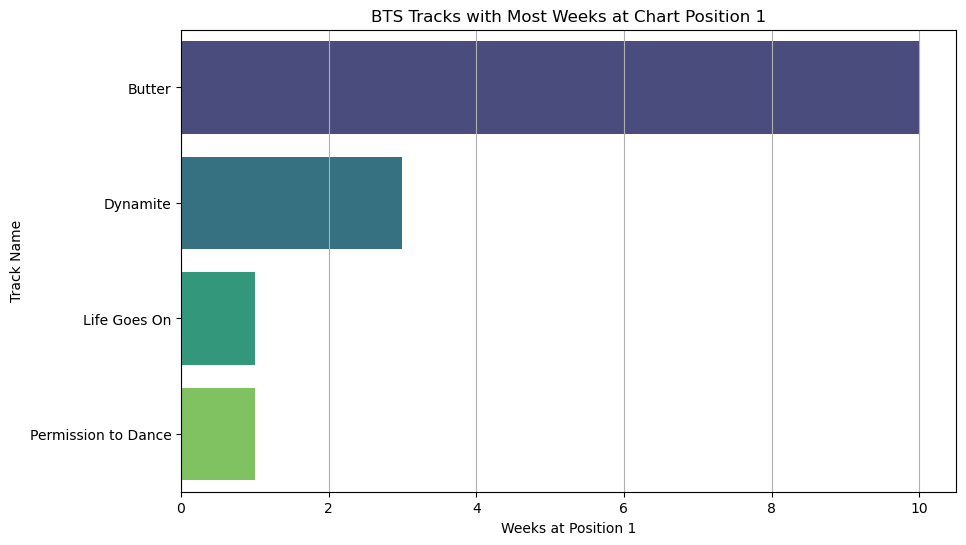

In [36]:
# Plot chart performance
plt.figure(figsize=(10, 6))
sns.barplot(data=bts_top_chart_tracks, x='weeks_at_position_1', y='name', palette='viridis')
plt.title("BTS Tracks with Most Weeks at Chart Position 1")
plt.xlabel("Weeks at Position 1")
plt.ylabel("Track Name")
plt.grid(axis='x')
plt.show()

# Audio Features of TOp Tracks

In [37]:
# Step 1: Identify top tracks
top_tracks = bts_top_chart_tracks['name'].tolist()
top_tracks

['Butter', 'Dynamite', 'Life Goes On', 'Permission to Dance']

In [38]:
bts_audio_features

,track_id,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
606,2WH4oy1SYppZrcdgKwSA0j,0.583,0.680,7.0,-7.809,1.0,0.4220,0.03040,0.000000,0.1890,0.343,97.568,4.0
611,0fZRNhPJ4AGmwY7rkpdbqK,0.583,0.817,9.0,-5.146,0.0,0.0990,0.11800,0.000000,0.3380,0.437,105.935,4.0
631,54azQnjuDYDFfImXimGFsA,0.708,0.857,6.0,-3.394,0.0,0.0827,0.00219,0.000000,0.1030,0.449,126.051,4.0
733,3XYRV7ZSHqIRDG87DKTtry,0.702,0.741,9.0,-5.330,1.0,0.0427,0.00544,0.000000,0.3370,0.646,124.925,4.0
971,10SRMwb9EuVS1K9rYsBfHQ,0.559,0.885,1.0,-4.515,1.0,0.1890,0.04320,0.000000,0.3330,0.683,172.029,4.0
1494,4bZZVcgWWMWPBwzTTp642w,0.779,0.762,10.0,-5.188,0.0,0.0631,0.02240,0.000000,0.1210,0.859,110.043,4.0
2032,6XxpvCj3eLWs3lYowSgC4G,0.612,0.841,10.0,-4.332,0.0,0.2190,0.01570,0.000000,0.2300,0.644,169.915,4.0
2118,0hxeouHqP3qzpTHerA7ha2,0.731,0.845,8.0,-5.352,1.0,0.1320,0.01320,0.000000,0.0782,0.484,101.085,4.0
2261,6wH3AP7b01vpzKYRJhreMy,0.719,0.757,2.0,-5.167,0.0,0.0849,0.13700,0.000000,0.1290,0.489,147.024,4.0
3558,3UHPGOkUcE4hE7sqBF4Snt,0.499,0.709,10.0,-6.404,1.0,0.1340,0.29600,0.000000,0.3310,0.314,164.032,4.0


featuredanceability
name
Butter                 0.759
Dynamite               0.746
Life Goes On           0.566
Permission to Dance    0.702
Name: danceability, dtype: float64


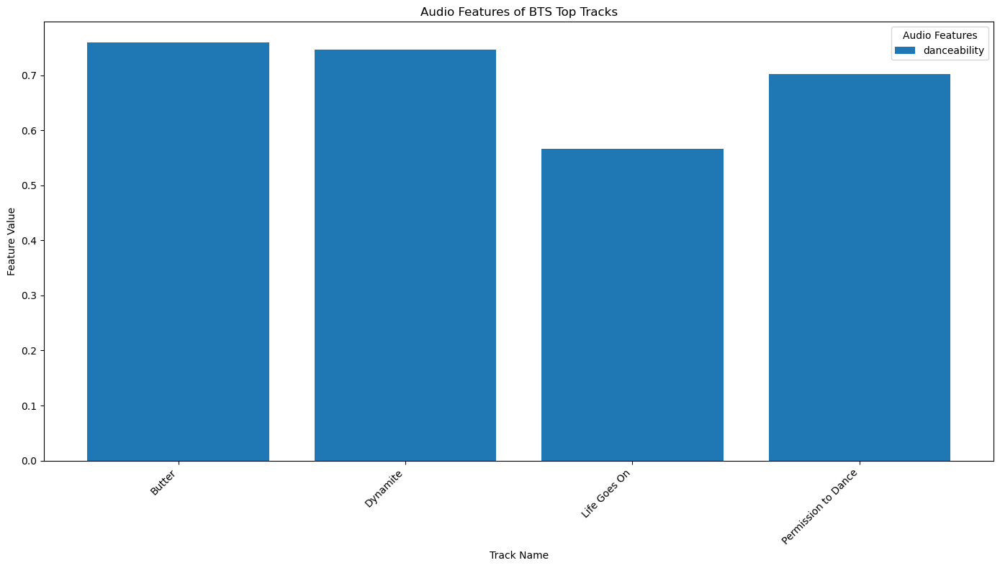

featureenergy
name
Butter                 0.459
Dynamite               0.765
Life Goes On           0.716
Permission to Dance    0.741
Name: energy, dtype: float64


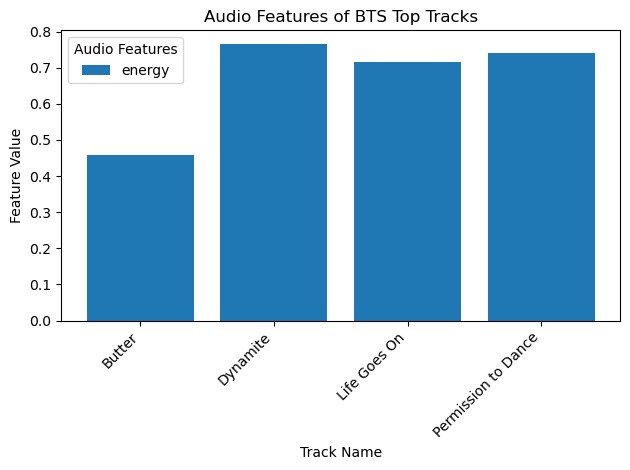

featurevalence
name
Butter                 0.695
Dynamite               0.737
Life Goes On           0.450
Permission to Dance    0.646
Name: valence, dtype: float64


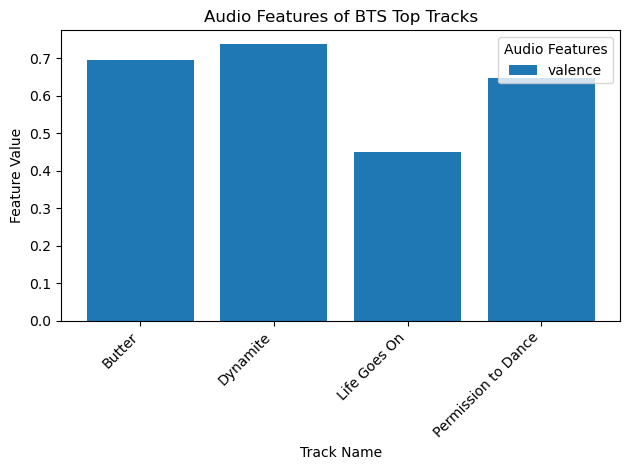

featuretempo
name
Butter                 109.997
Dynamite               114.044
Life Goes On            81.068
Permission to Dance    124.925
Name: tempo, dtype: float64


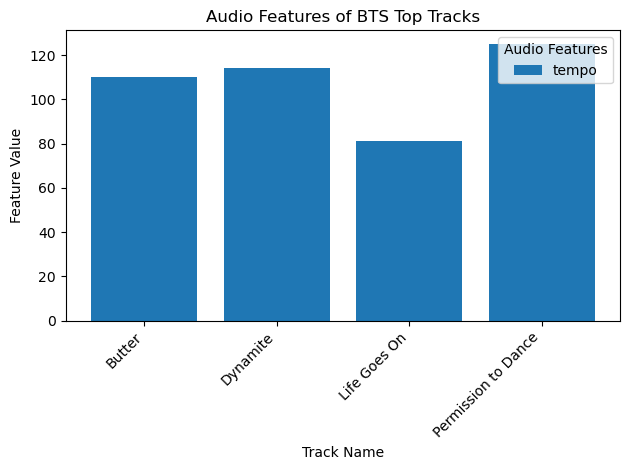

featureacousticness
name
Butter                 0.00323
Dynamite               0.01120
Life Goes On           0.00691
Permission to Dance    0.00544
Name: acousticness, dtype: float64


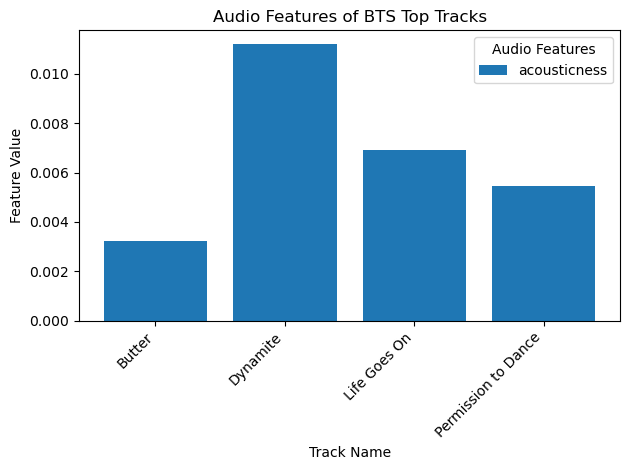

featureinstrumentalness
name
Butter                 0.0
Dynamite               0.0
Life Goes On           0.0
Permission to Dance    0.0
Name: instrumentalness, dtype: float64


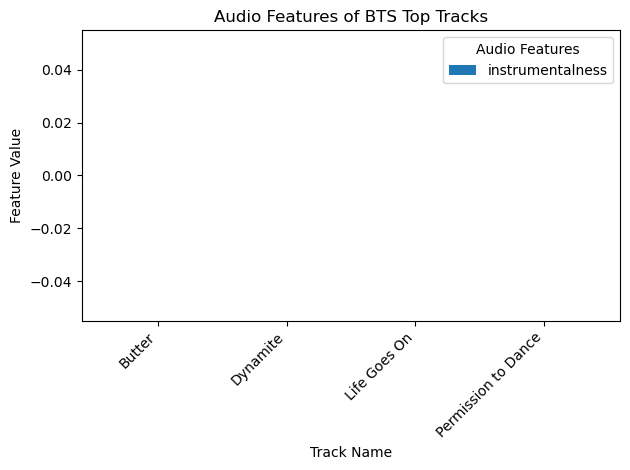

In [39]:
# Step 1: Identify top tracks
top_tracks = bts_top_chart_tracks['name'].tolist()

# Step 2: Extract audio features for top tracks
top_tracks_features = bts_data[bts_data['name'].isin(top_tracks)]

# Step 3: Plot audio feature comparison for top tracks
audio_features = ['danceability', 'energy', 'valence', 'tempo', 'acousticness', 'instrumentalness']
plt.figure(figsize=(14, 8))

# Use a bar plot to compare audio features
for feature in audio_features:
    feature_means = top_tracks_features.groupby('name')[feature].mean()
    print(f'feature{feature}')
    print(feature_means)
    plt.bar(feature_means.index, feature_means.values, label=feature)

    plt.title("Audio Features of BTS Top Tracks")
    plt.xlabel("Track Name")
    plt.ylabel("Feature Value")
    plt.legend(title="Audio Features")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()




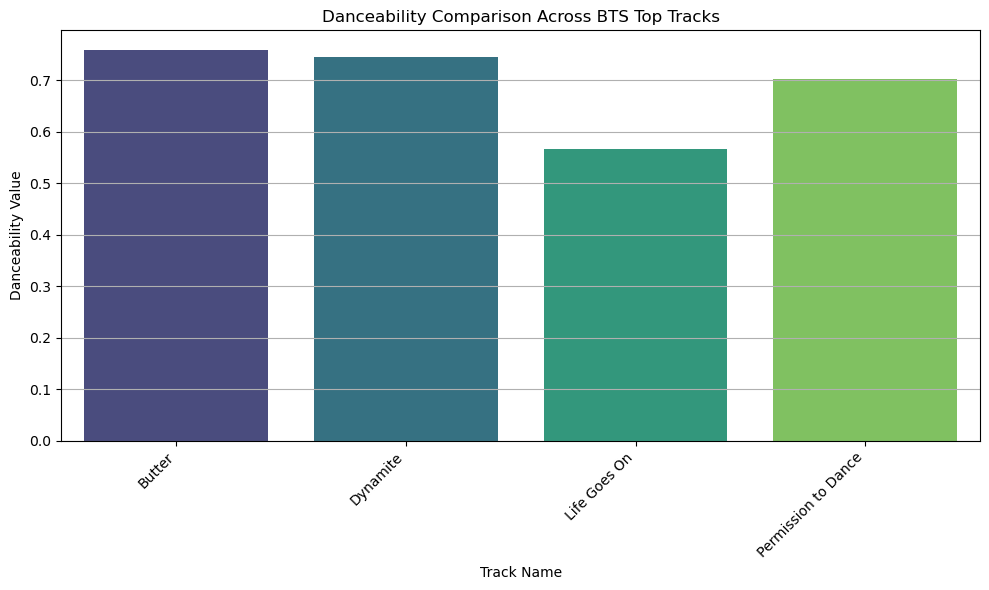

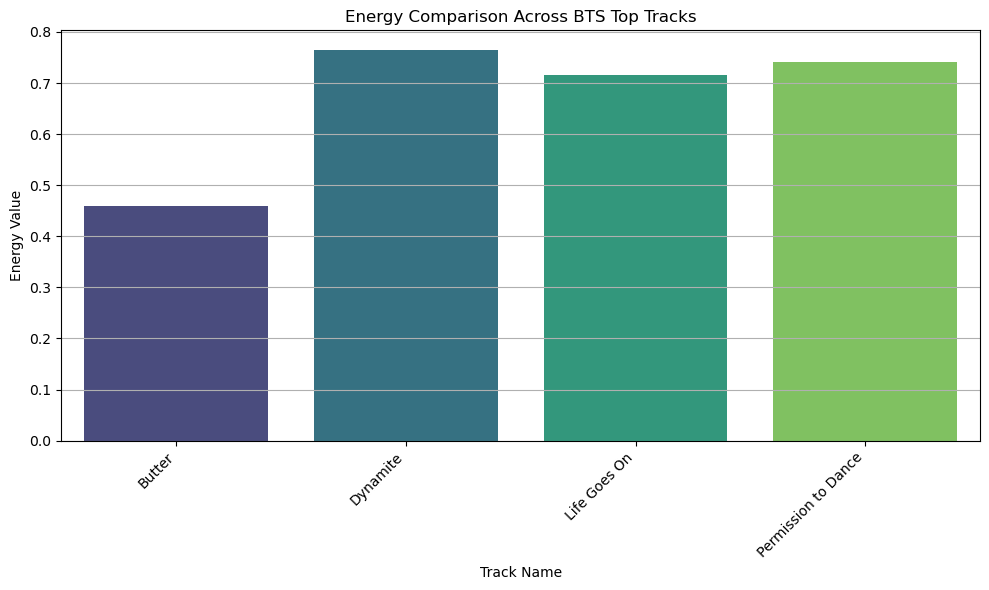

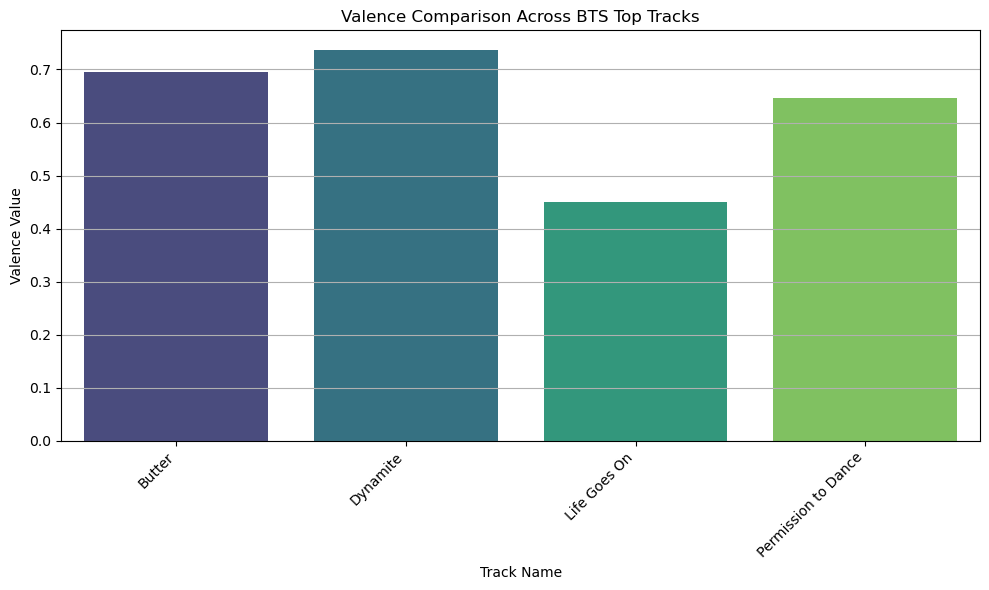

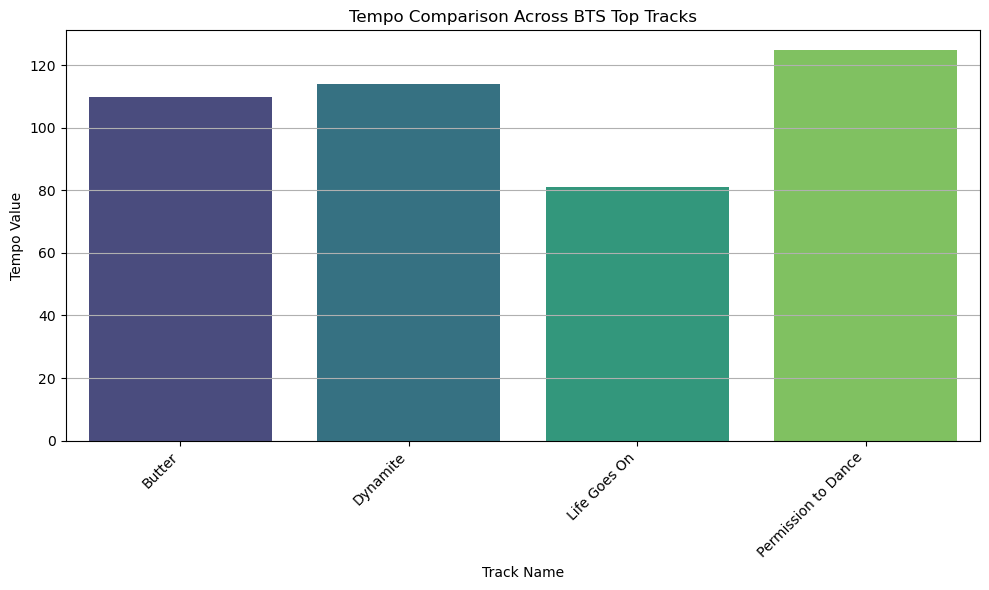

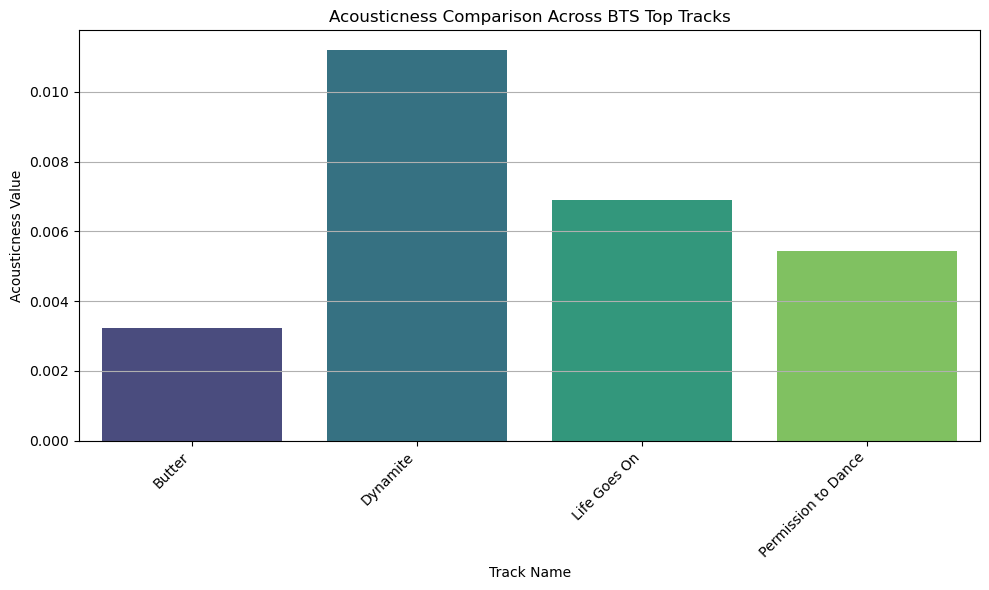

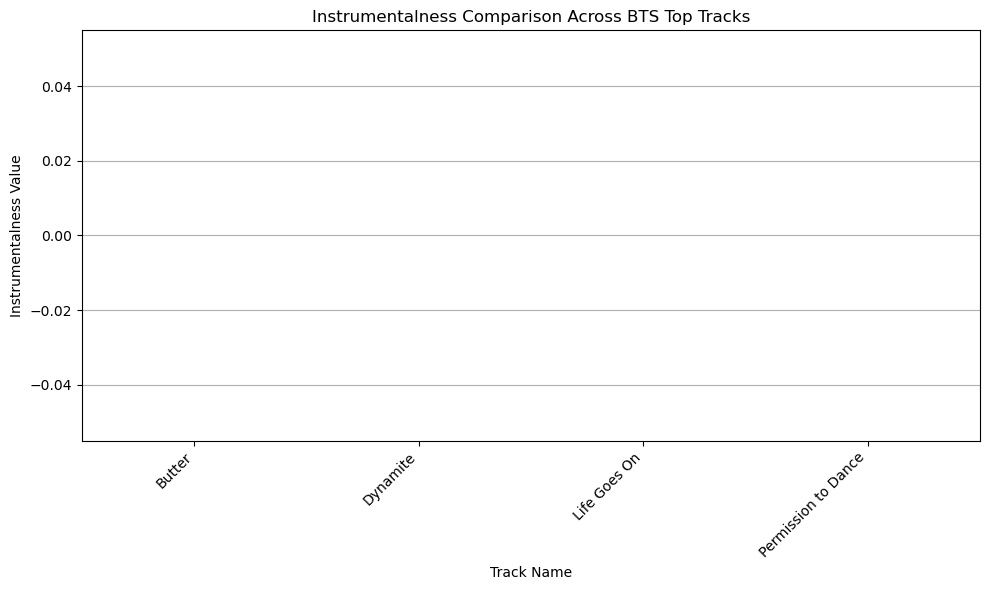

In [40]:
# Step 1: Individual bar charts for each audio feature
for feature in audio_features:
    feature_means = top_tracks_features.groupby('name')[feature].mean()
    
    # Plotting each feature as a bar chart
    plt.figure(figsize=(10, 6))
    sns.barplot(x=feature_means.index, y=feature_means.values, palette='viridis')
    plt.title(f"{feature.capitalize()} Comparison Across BTS Top Tracks")
    plt.xlabel("Track Name")
    plt.ylabel(f"{feature.capitalize()} Value")
    plt.xticks(rotation=45, ha='right')
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()


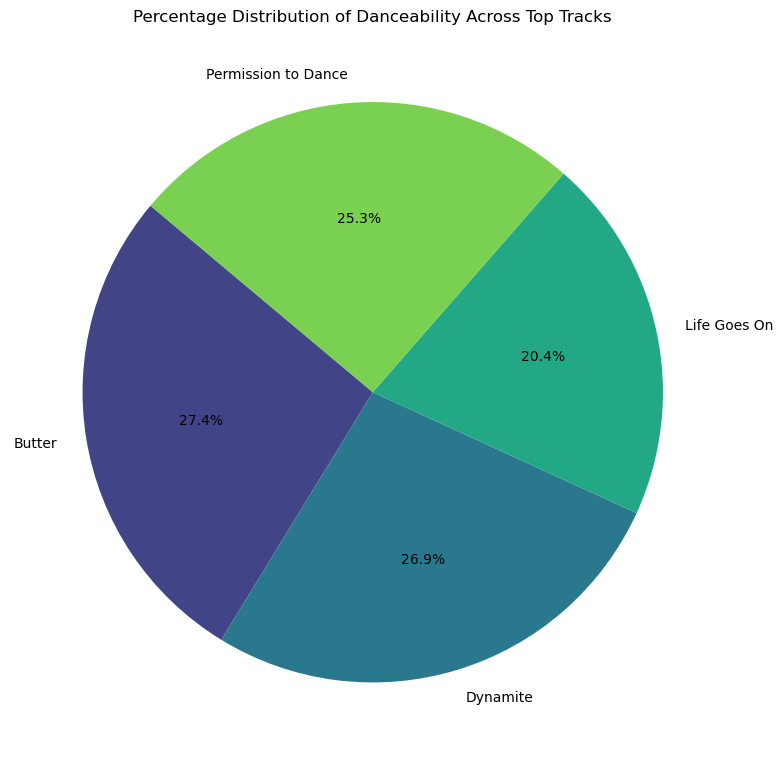

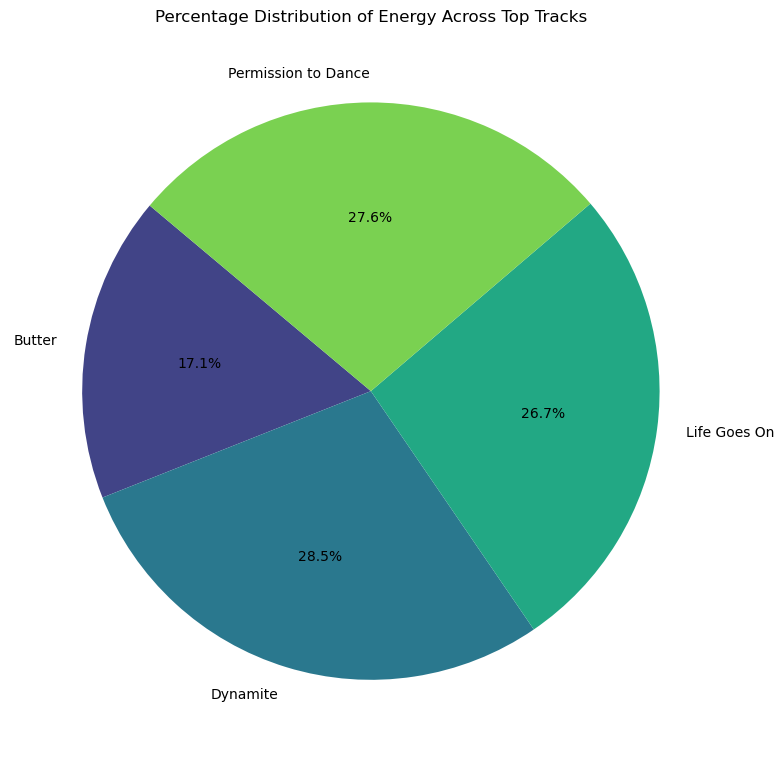

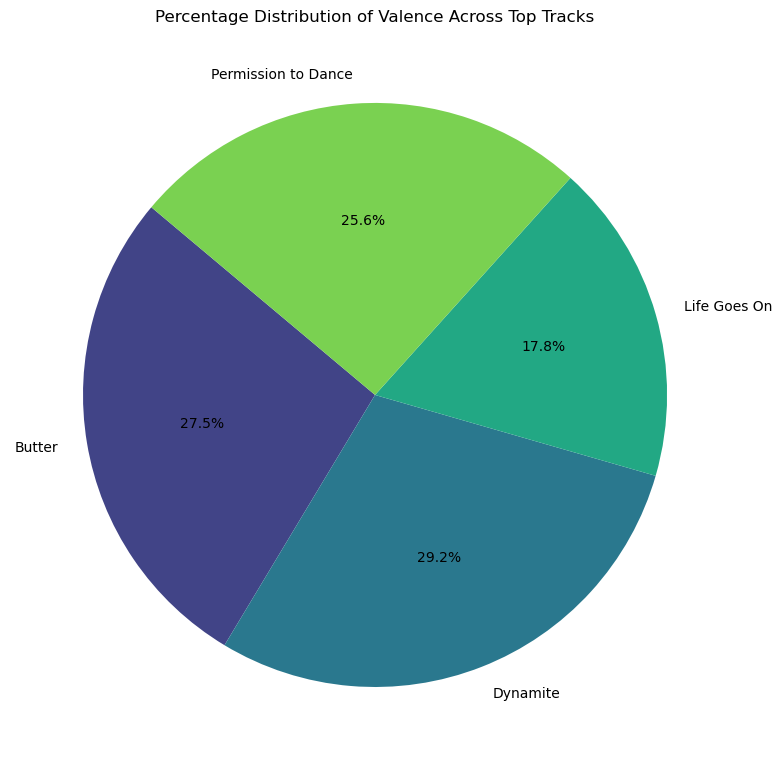

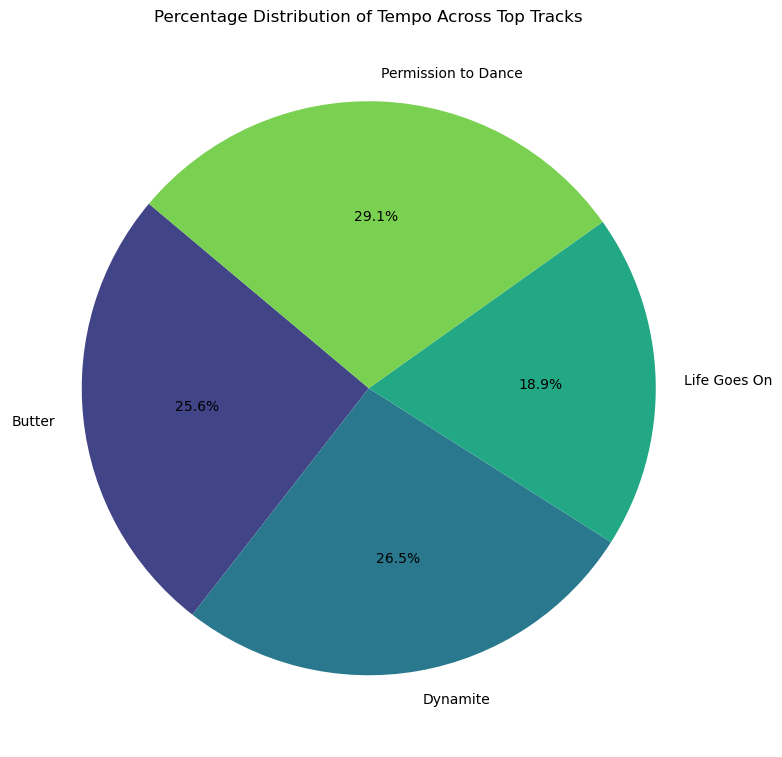

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure audio_features is a list of valid column names
audio_features = ['danceability', 'energy', 'valence', 'tempo']  # Example feature list

# Pie charts for each feature
for feature in audio_features:
    if feature not in top_tracks_features.columns:
        print(f"Feature '{feature}' not found in the dataset. Skipping.")
        continue
    
    # Group by 'name' and calculate mean for the feature
    feature_means = top_tracks_features.groupby('name')[feature].mean()
    
    if feature_means.empty:
        print(f"No data available for feature '{feature}'. Skipping.")
        continue

    # Calculate percentages
    total = feature_means.sum()
    if total == 0:
        print(f"Total for feature '{feature}' is zero. Skipping.")
        continue

    percentages = (feature_means / total) * 100  # Convert to percentage
    
    # Plot the pie chart
    plt.figure(figsize=(8, 8))
    plt.pie(
        percentages.values,
        labels=percentages.index,
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette('viridis', len(percentages))
    )
    plt.title(f"Percentage Distribution of {feature.capitalize()} Across Top Tracks")
    plt.tight_layout()
    plt.show()


In [42]:
feature_means

name
Butter                 109.997
Dynamite               114.044
Life Goes On            81.068
Permission to Dance    124.925
Name: tempo, dtype: float64

<Figure size 1200x800 with 0 Axes>

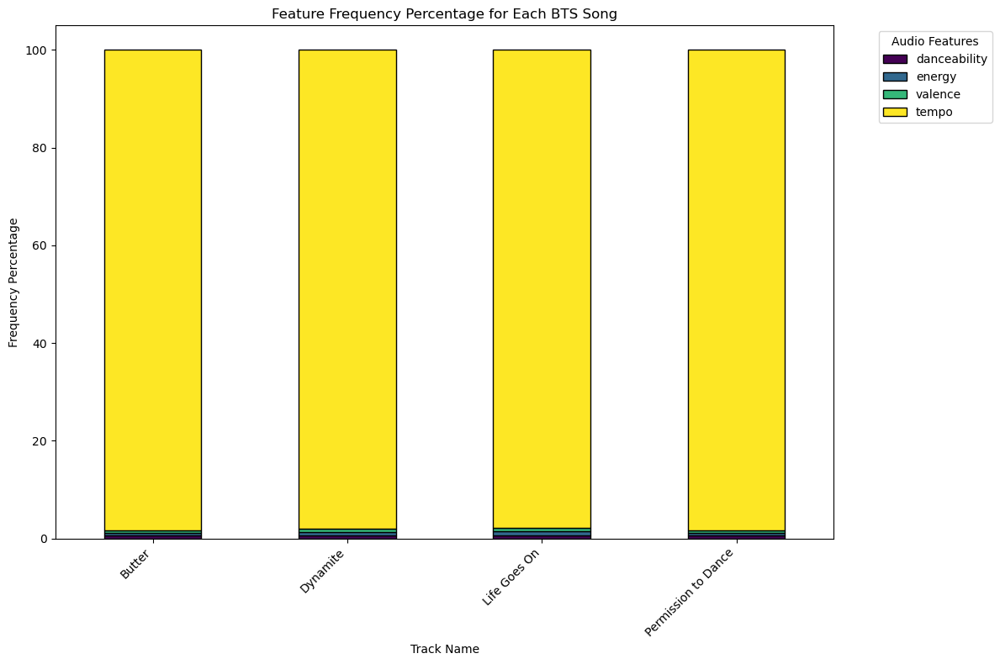

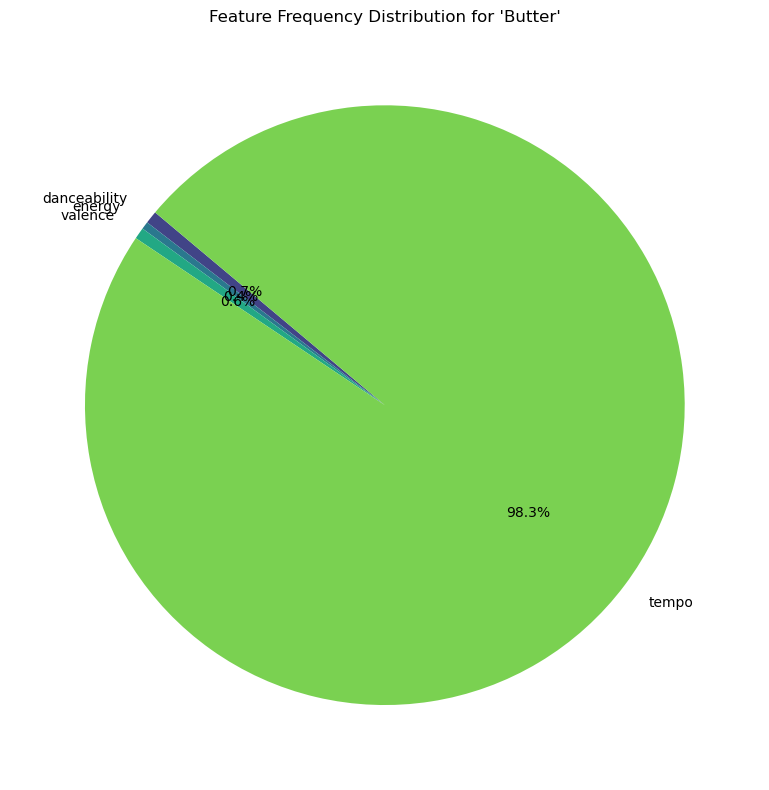

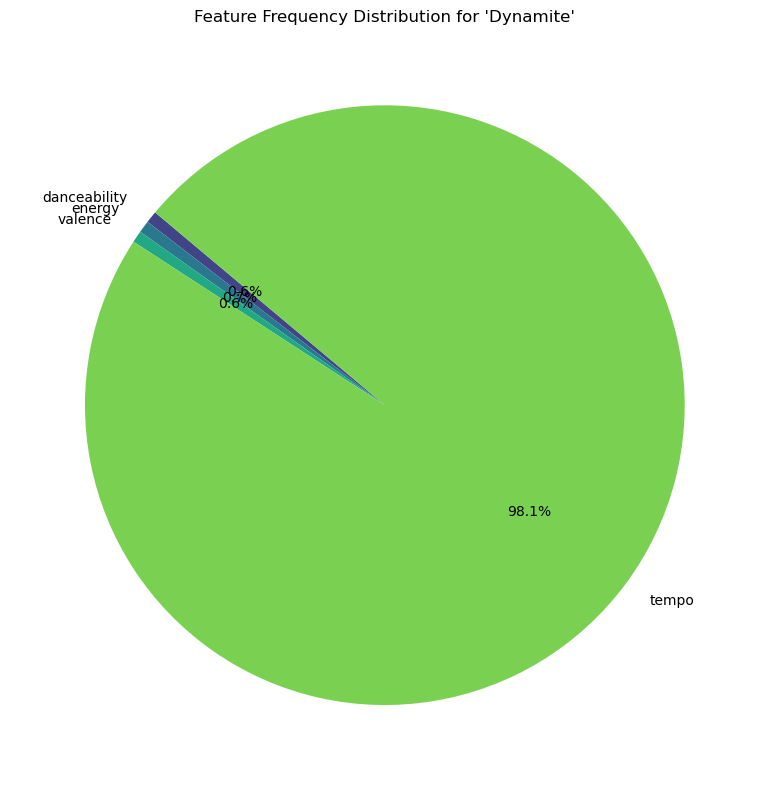

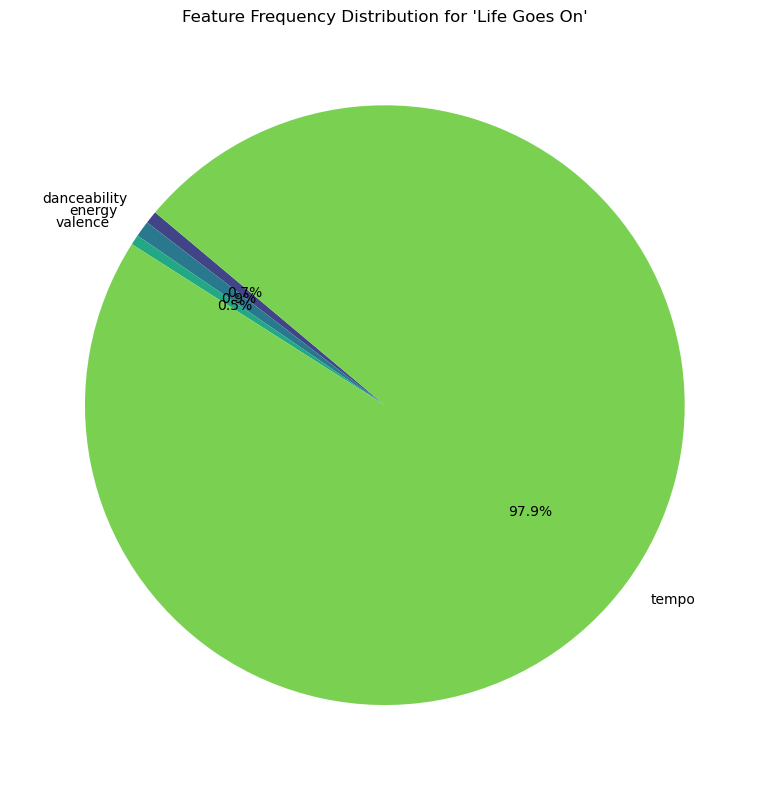

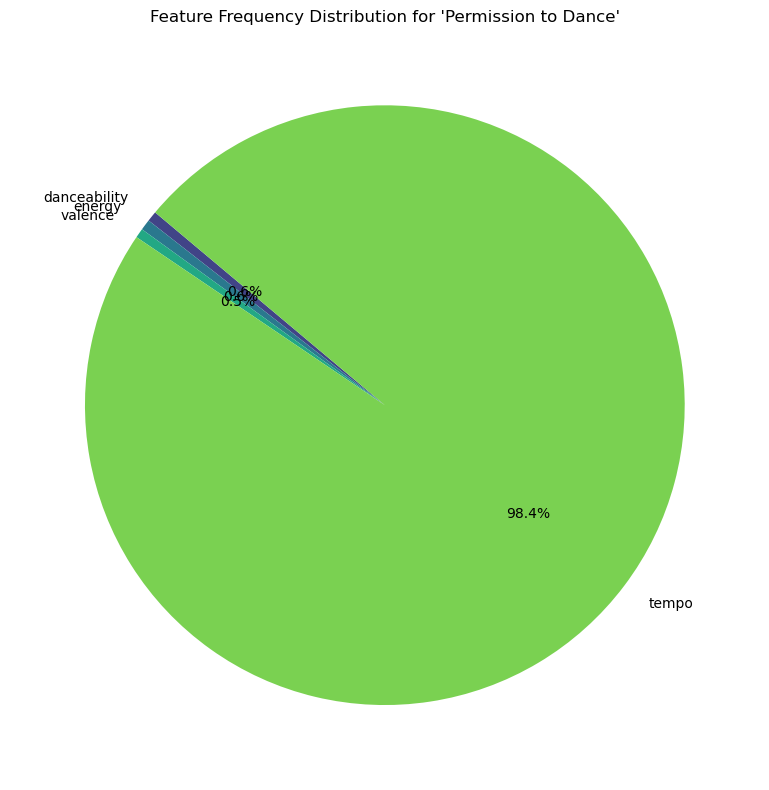

In [43]:
# Step 1: Normalize feature values for frequency per song
feature_frequencies = top_tracks_features.groupby('name')[audio_features].mean()
feature_frequencies = feature_frequencies.div(feature_frequencies.sum(axis=1), axis=0) * 100

# Step 2: Stacked bar chart for feature frequency per song
plt.figure(figsize=(12, 8))
feature_frequencies.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 8),
    colormap='viridis',
    edgecolor='black'
)
plt.title("Feature Frequency Percentage for Each BTS Song")
plt.xlabel("Track Name")
plt.ylabel("Frequency Percentage")
plt.xticks(rotation=45, ha='right')
plt.legend(title="Audio Features", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Step 3: Pie charts for each song's feature frequencies
for track in feature_frequencies.index:
    plt.figure(figsize=(8, 8))
    plt.pie(
        feature_frequencies.loc[track],
        labels=feature_frequencies.columns,
        autopct='%1.1f%%',
        startangle=140,
        colors=sns.color_palette('viridis', len(feature_frequencies.columns))
    )
    plt.title(f"Feature Frequency Distribution for '{track}'")
    plt.tight_layout()
    plt.show()


# General Analysis

             avg_chart_position  track_count
album_type                                  
compilation           40.057971          276
album                 49.075396        18290
single                53.018311         8192


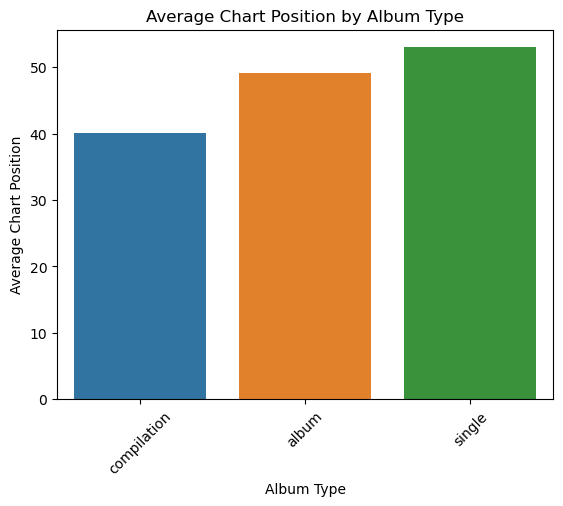

In [44]:
# Merge datasets to analyze album types
album_performance = (
    df_tracks
    .merge(df_chart_positions, on='track_id')
    .groupby('album_type')
    .agg(
        avg_chart_position=('list_position', 'mean'),
        track_count=('track_id', 'count')
    )
    .sort_values(by='avg_chart_position')
)

print(album_performance)

# Visualize
sns.barplot(x=album_performance.index, y=album_performance['avg_chart_position'])
plt.title("Average Chart Position by Album Type")
plt.xlabel("Album Type")
plt.ylabel("Average Chart Position")
plt.xticks(rotation=45)
plt.show()


# Explicit performance

          avg_chart_position  track_count
explicit                                 
False              49.625593        13902
True               50.799315        12856


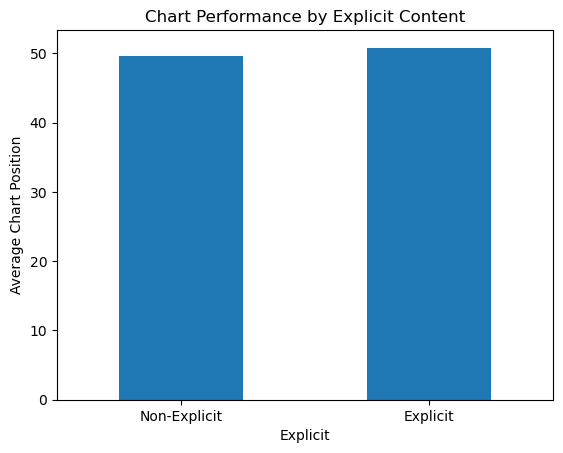

In [45]:
# Merge datasets
explicit_performance = (
    df_tracks
    .merge(df_chart_positions, on='track_id')
    .groupby('explicit')
    .agg(
        avg_chart_position=('list_position', 'mean'),
        track_count=('track_id', 'count')
    )
)

print(explicit_performance)

# Visualize
explicit_performance.plot(kind='bar', y='avg_chart_position', legend=False)
plt.title("Chart Performance by Explicit Content")
plt.xlabel("Explicit")
plt.ylabel("Average Chart Position")
plt.xticks([0, 1], ['Non-Explicit', 'Explicit'], rotation=0)
plt.show()


                 tempo  list_position
tempo          1.00000        0.00665
list_position  0.00665        1.00000


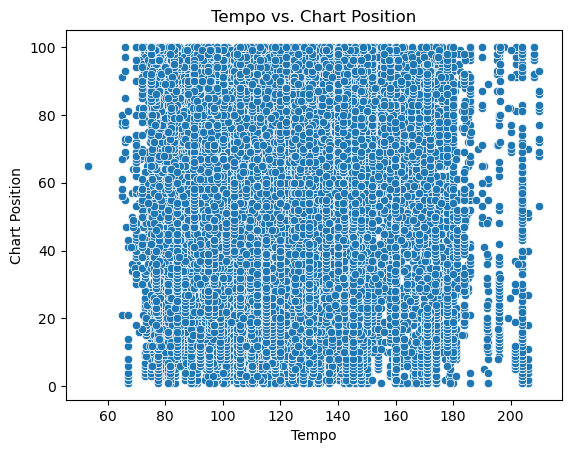

In [46]:
# Analyze tempo and popularity
tempo_popularity = (
    df_audio_features
    .merge(df_chart_positions, on='track_id')
)

# Correlation analysis
correlation = tempo_popularity[['tempo', 'list_position']].corr()
print(correlation)

# Scatter plot
sns.scatterplot(data=tempo_popularity, x='tempo', y='list_position')
plt.title("Tempo vs. Chart Position")
plt.xlabel("Tempo")
plt.ylabel("Chart Position")
plt.show()


In [47]:
df.merge

<bound method DataFrame.merge of                     artist_id                track_id
0                   artist_id                track_id
1      00FQb4jTyendYWaN8pK0wa  4zmKGsrXjLmljb5fTaBTot
2      00FQb4jTyendYWaN8pK0wa  6GGtHZgBycCgGBUhZo81xe
3      00FQb4jTyendYWaN8pK0wa  22DH8NChecsgPxDjA4pqer
4      00FQb4jTyendYWaN8pK0wa  7JVNRVPeXFAOdMrxOHNjVv
5      00FQb4jTyendYWaN8pK0wa  24jvD83UgLmrdGjhWTFslY
6      00FQb4jTyendYWaN8pK0wa  2nMeu6UenVvwUktBCpLMK9
7      00FQb4jTyendYWaN8pK0wa  6PUIzlqotEmPuBfjbwYWOB
8      00FQb4jTyendYWaN8pK0wa  5Y6nVaayzitvsD5F7nr3DV
9      00FQb4jTyendYWaN8pK0wa  4VSg5K1hnbmIg4PwRdY6wV
10     00FQb4jTyendYWaN8pK0wa  1y3r6RXiJZNBV1EI0NggpS
11     00FQb4jTyendYWaN8pK0wa  7g3htkaLz4ETFn0cifwM3y
12     00FQb4jTyendYWaN8pK0wa  1gZADNt16Oh23jWyMYRk4p
13     00FQb4jTyendYWaN8pK0wa  4EDijkJdHBZZ0GwJ12iTAj
14     00FQb4jTyendYWaN8pK0wa  2Kerz9H9IejzeIpjhDJoYG
15     00FQb4jTyendYWaN8pK0wa  0mt02gJ425Xjm7c3jYkOBn
16     00FQb4jTyendYWaN8pK0wa  0Oqc0kKFsQ6MhFOLBN

In [48]:
import pandas as pd

# Assuming df_tracks is the DataFrame with track details

# Step 1: Get the artist_id for BTS
bts_artist = df_artists.loc[df_artists['name'] == 'BTS']
bts_id = bts_artist['artist_id'].iloc[0]

# Step 2: Get all tracks by BTS
bts_tracks_mapping = df_tracks_artists_mapping.loc[df_tracks_artists_mapping['artist_id'] == bts_id]
bts_track_ids = bts_tracks_mapping['track_id'].unique()

# Step 3: Filter tracks data for BTS
bts_tracks = df_tracks.loc[df_tracks['track_id'].isin(bts_track_ids)]

# Step 4: Extract the earliest release year
# Ensure release_date is in datetime format
bts_tracks['release_date'] = pd.to_datetime(bts_tracks['release_date'], errors='coerce')
bts_tracks['release_year'] = bts_tracks['release_date'].dt.year

# Find the earliest release year
earliest_year = bts_tracks['release_year'].min()

print(f"BTS first entered Spotify in the year {earliest_year}.")


BTS first entered Spotify in the year nan.


C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\3398044080.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bts_tracks['release_date'] = pd.to_datetime(bts_tracks['release_date'], errors='coerce')
C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\3398044080.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bts_tracks['release_year'] = bts_tracks['release_date'].dt.year


In [49]:
# 1. Artist Dominance
# Merge artists with track-to-artist mapping and chart positions
df_artist_dominance = (df_tracks_artists_mapping
                       .merge(df_artists, on='artist_id')
                       .merge(df_chart_positions, on='track_id'))
# Group by artist and calculate average chart position and popularity
artist_dominance = (df_artist_dominance
                    .groupby(['artist_id', 'name'])
                    .agg(avg_chart_position=('list_position', 'mean'),
                         avg_popularity=('popularity', 'mean'),
                         followers=('followers', 'mean'))
                    .reset_index())

artist_dominance

,artist_id,name,avg_chart_position,avg_popularity,followers
0,00FQb4jTyendYWaN8pK0wa,Lana Del Rey,59.125000,92.0,40583711.0
1,027TpXKGwdXP7iwbjUSpV8,The Walters,84.125000,73.0,805092.0
2,028lPW2NdWHdSPCkRkcyhd,Ant Clemons,94.000000,51.0,42019.0
3,02ZtVIjKL1PYLlMmP1sz0h,Layton Greene,75.750000,56.0,550438.0
4,02kJSzxNuaWGqwubyUba0Z,G-Eazy,67.500000,78.0,5471164.0
5,02rd0anEWfMtF7iMku9uor,Reba McEntire,69.090909,62.0,2099964.0
6,048LktY5zMnakWq7PTtFrz,CKay,38.758621,69.0,1536565.0
7,04gDigrS5kc9YWfZHwBETP,Maroon 5,27.492063,87.0,42858633.0
8,04uu8U3I1h26Fp2NBkPTRZ,Sam Tompkins,61.800000,60.0,221414.0
9,05ZOzt8hlefGYXWJIL37PI,Tate Kobang,80.000000,42.0,21205.0


In [50]:
# Merge tracks with chart positions
df_album_genre = df_tracks.merge(df_chart_positions, on='track_id')
# Group by album type and calculate average chart position and track counts
album_genre_trends = (df_album_genre.groupby('album_type').agg(avg_chart_position=('list_position', 'mean'), track_count=('track_id', 'count')).reset_index())
album_genre_trends

,album_type,avg_chart_position,track_count
0,album,49.075396,18290
1,compilation,40.057971,276
2,single,53.018311,8192


In [51]:
# 3. Audio Evolution
# Merge tracks with audio features
df_audio_evolution = df_tracks.merge(df_audio_features, on='track_id')
df_audio_evolution['release_year'] = pd.to_datetime(df_audio_evolution['release_date']).dt.year
# Group by release year and calculate average audio features
audio_evolution = (df_audio_evolution
                   .groupby('release_year')
                   .agg(danceability=('danceability', 'mean'),
                        energy=('energy', 'mean'),
                        valence=('valence', 'mean'),
                        tempo=('tempo', 'mean'))
                   .reset_index())
df_audio_evolution

,track_id,name,duration_ms,release_date,album_type,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,release_year
0,5CMVGP24paZIukljDj0iWc,Jingle Bells (with The Ken Lane Singers),156666,1945-01-01,compilation,False,0.5420,0.15900,8.0,-14.405,1.0,0.0294,0.868000,0.000000,0.0774,0.6340,137.569,4.0,1945.0
1,25leEEaz1gIpp7o21Fqyjo,Here Comes Santa Claus (Right Down Santa Claus...,150266,1947-01-01,album,False,0.8340,0.37100,1.0,-11.990,1.0,0.0358,0.799000,0.000000,0.2750,0.9760,96.628,4.0,1947.0
2,1dtIaSlyrLI04sqYa8nLyN,Rudolph the Red-Nosed Reindeer,186733,1947-01-01,album,False,0.6290,0.15900,8.0,-14.056,1.0,0.0495,0.883000,0.000000,0.2220,0.6420,142.157,4.0,1947.0
3,4PS1e8f2LvuTFgUs1Cn3ON,The Christmas Song (Merry Christmas To You),192160,1962-01-01,album,False,0.3200,0.21000,6.0,-15.231,1.0,0.0345,0.920000,0.000080,0.1380,0.2080,73.196,5.0,1962.0
4,4PS1e8f2LvuTFgUs1Cn3ON,The Christmas Song (Merry Christmas To You),192160,1962-01-01,album,False,0.3200,0.21000,6.0,-15.231,1.0,0.0345,0.920000,0.000080,0.1380,0.2080,73.196,5.0,1962.0
5,4PS1e8f2LvuTFgUs1Cn3ON,The Christmas Song (Merry Christmas To You),192160,1962-01-01,album,False,0.3200,0.21000,6.0,-15.231,1.0,0.0345,0.920000,0.000080,0.1380,0.2080,73.196,5.0,1962.0
6,5ASM6Qjiav2xPe7gRkQMsQ,Sleigh Ride,181266,1963-01-01,compilation,False,0.5290,0.77200,2.0,-7.013,1.0,0.0287,0.403000,0.000002,0.3160,0.8530,91.751,4.0,1963.0
7,46pF1zFimM582ss1PrMy68,Christmas (Baby Please Come Home),166453,1963-01-01,compilation,False,0.3250,0.75900,8.0,-7.146,1.0,0.0530,0.395000,0.000362,0.0773,0.3600,126.627,4.0,1963.0
8,7uyivkbdc8iH8wyBGBhlXV,One More Chance,229000,1979-01-01,compilation,False,0.4760,0.59600,7.0,-4.234,1.0,0.0705,0.108000,0.000000,0.1380,0.5490,80.740,4.0,1979.0
9,2uX5f3x2cObov0iDAPln4o,Song of the South,190800,1980-01-01,album,False,0.4860,0.63300,9.0,-8.414,1.0,0.0365,0.176000,0.000000,0.3120,0.6690,162.158,4.0,1980.0


In [52]:
# 4. Explicit Content Impact
# Merge tracks with chart positions
df_explicit_impact = df_tracks.merge(df_chart_positions, on='track_id')
# Group by explicit content and calculate average chart position
explicit_content_impact = (df_explicit_impact
                           .groupby('explicit')
                           .agg(avg_chart_position=('list_position', 'mean'),
                                track_count=('track_id', 'count'))
                           .reset_index())

In [53]:
# 5. Tempo-Popularity Link
# Merge audio features with chart positions
df_tempo_popularity = df_audio_features.merge(df_chart_positions, on='track_id')
# Calculate correlation between tempo and chart position
tempo_correlation = df_tempo_popularity[['tempo', 'list_position']].corr()
tempo_correlation

,tempo,list_position
tempo,1.00000,0.00665
list_position,0.00665,1.00000


# Market Distribution(US, UK, Jp, Cn) by BTS and stray kid

C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\2586241772.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  artist_market_data['available_market'] = artist_market_data['available_market'].str.split(',')
C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\2586241772.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  artist_market_data['available_market'] = artist_market_data['available_market'].str.split(',')


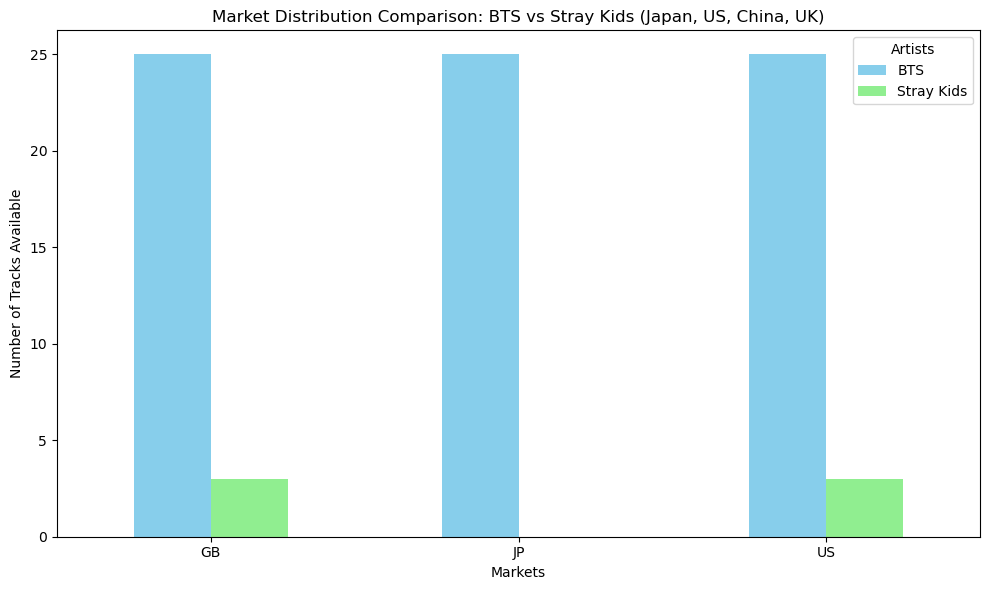

In [57]:
# Helper function to calculate market counts for an artist
def get_market_distribution(artist_name, specific_markets):
    # Step 1: Find the artist_id
    artist_id = df_artists[df_artists['name'] == artist_name]['artist_id'].iloc[0]
    
    # Step 2: Get all tracks associated with the artist (filter by artist_id)
    artist_tracks = df_tracks_artists_mapping[df_tracks_artists_mapping['artist_id'] == artist_id]
    
    # Step 3: Extract the track_ids
    artist_track_ids = artist_tracks['track_id'].tolist()
    
    # Step 4: Filter the market dataset to only include the artist's tracks
    artist_market_data = market[market['track_id'].isin(artist_track_ids)]
    
    # Step 5: Split the available markets and count their occurrences
    artist_market_data['available_market'] = artist_market_data['available_market'].str.split(',')
    markets_count = artist_market_data['available_market'].explode().value_counts()
    
    # Step 6: Filter for specific markets
    filtered_markets = markets_count[markets_count.index.isin(specific_markets)]
    
    return filtered_markets

# Define specific markets
specific_markets = ['JP', 'US', 'CN', 'GB']  # Japan, US, China, UK

# Get market distributions for BTS and Stray Kids
bts_markets = get_market_distribution('BTS', specific_markets)
stray_kids_markets = get_market_distribution('Stray Kids', specific_markets)

# Combine data into a single DataFrame for plotting
comparison_df = pd.DataFrame({
    'BTS': bts_markets,
    'Stray Kids': stray_kids_markets
}).fillna(0)  # Fill NaN with 0 for missing markets

# Plot the comparison
comparison_df.plot(kind='bar', figsize=(10, 6), color=['skyblue', 'lightgreen'])
plt.title('Market Distribution Comparison: BTS vs Stray Kids (Japan, US, China, UK)')
plt.xlabel('Markets')
plt.ylabel('Number of Tracks Available')
plt.xticks(rotation=0)
plt.legend(title='Artists')
plt.tight_layout()
plt.show()

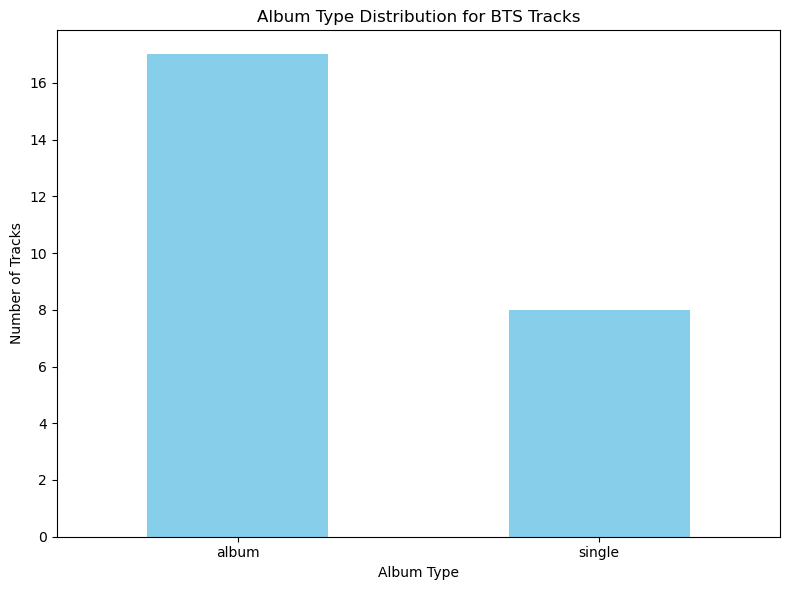

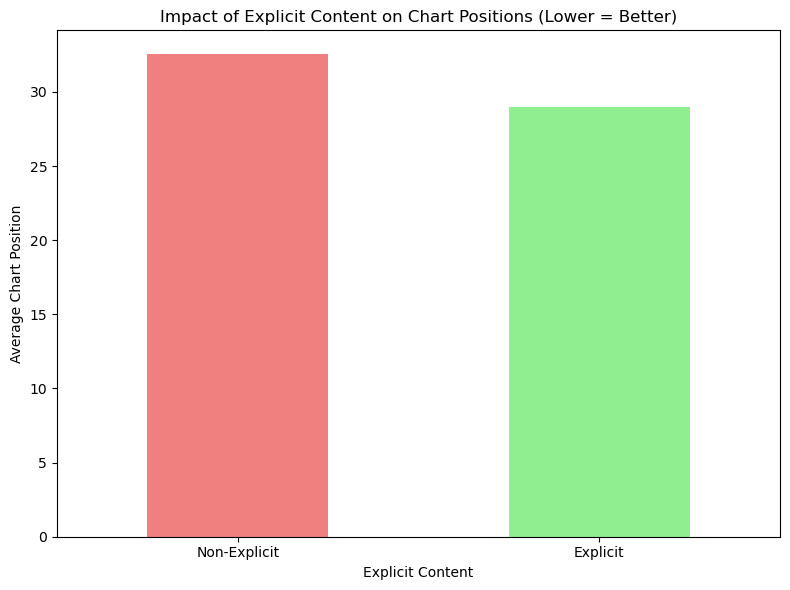

In [61]:

bts_artist_id = df_artists[df_artists['name'] == 'BTS']['artist_id'].iloc[0]

# Step 2: Get BTS's tracks
bts_tracks_mapping = df_tracks_artists_mapping[df_tracks_artists_mapping['artist_id'] == bts_artist_id]
bts_track_ids = bts_tracks_mapping['track_id'].tolist()

# Step 3: Filter BTS's data in relevant datasets
bts_tracks = df_tracks[df_tracks['track_id'].isin(bts_track_ids)]
bts_chart_positions = df_chart_positions[df_chart_positions['track_id'].isin(bts_track_ids)]
bts_audio_features = df_audio_features[df_audio_features['track_id'].isin(bts_track_ids)]
# --- Analysis 1: Album Type Trends ---
album_type_counts = bts_tracks['album_type'].value_counts()

plt.figure(figsize=(8, 6))
album_type_counts.plot(kind='bar', color='skyblue')
plt.title('Album Type Distribution for BTS Tracks')
plt.xlabel('Album Type')
plt.ylabel('Number of Tracks')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Analysis 2: Explicit Content Impact ---
# Merge chart positions with track data to analyze explicit content
bts_chart_explicit = bts_chart_positions.merge(bts_tracks, on='track_id', how='inner')

explicit_counts = bts_chart_explicit.groupby('explicit')['list_position'].mean()

plt.figure(figsize=(8, 6))
explicit_counts.plot(kind='bar', color=['lightcoral', 'lightgreen'])
plt.title('Impact of Explicit Content on Chart Positions (Lower = Better)')
plt.xlabel('Explicit Content')
plt.ylabel('Average Chart Position')
plt.xticks(ticks=[0, 1], labels=['Non-Explicit', 'Explicit'], rotation=0)
plt.tight_layout()
plt.show()



Summary of Insights to Derive
Artist Dominance: Identify which artists consistently perform well on charts.
Album/Genre Trends: Understand which album types (e.g., singles, albums) perform better.
Audio Evolution: Observe how characteristics of popular music have evolved over time.
Explicit Content Impact: Determine the role of explicit content in chart success.
Tempo-Popularity Link: Assess whether higher/lower tempo influences popularity.

In [64]:
# Merge datasets
df_artists_tracks = pd.merge(df_tracks_artists_mapping, df_artists, on='artist_id')
df_full_data = pd.merge(df_artists_tracks, df_audio_features, on='track_id')
df_full_data = pd.merge(df_full_data, df_tracks, on='track_id', suffixes=('_artist', '_track'))

# Filter for BTS and Stray Kids
bts_straykids_data = df_full_data[df_full_data['name_artist'].isin(['BTS', 'Stray Kids'])]

bts_straykids_data

,Unnamed: 0_x,artist_id,track_id,Unnamed: 0_y,name_artist,popularity,followers,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,Unnamed: 0,name_track,duration_ms,release_date,album_type,explicit
2782,6651,3Nrfpe0tUJi4K4DXYWgMUX,59bY27SZQ4r25o02vqOhgC,3045,BTS,87,76212947,0.603,0.771,9.0,-6.336,1.0,0.0627,0.19400,0.000000,0.1300,0.332,139.988,4.0,10074,Girl Of My Dreams (with SUGA of BTS),226149,2022-03-18,album,True
3101,6635,3Nrfpe0tUJi4K4DXYWgMUX,54azQnjuDYDFfImXimGFsA,3045,BTS,87,76212947,0.708,0.857,6.0,-3.394,0.0,0.0827,0.00219,0.000000,0.1030,0.449,126.051,4.0,5143,IDOL,260233,2018-08-24,album,False
6994,6637,3Nrfpe0tUJi4K4DXYWgMUX,4a9tbd947vo9K8Vti9JwcI,3045,BTS,87,76212947,0.645,0.862,11.0,-4.761,0.0,0.0845,0.09330,0.000000,0.1930,0.803,119.947,4.0,5283,Boy With Luv (feat. Halsey),229773,2019-04-12,album,False
7819,5398,2dIgFjalVxs4ThymZ67YCE,1OG1NoKpZZLrMqMYCk9m84,3018,Stray Kids,85,17037770,0.705,0.849,0.0,-2.595,1.0,0.0493,0.06470,0.000000,0.6530,0.609,125.976,4.0,6568,LALALALA,182224,2023-11-10,album,False
7820,5399,2dIgFjalVxs4ThymZ67YCE,5NxxixRIBePmP5iNl9lPOt,3018,Stray Kids,85,17037770,0.829,0.705,5.0,-5.298,0.0,0.1930,0.15200,0.000000,0.1450,0.684,133.095,4.0,6706,Lose My Breath (Stray Kids Ver.),166913,2024-05-13,single,False
7821,5400,2dIgFjalVxs4ThymZ67YCE,09keT5ocFhEd5W5HidiUNq,3018,Stray Kids,85,17037770,0.925,0.740,2.0,-2.698,1.0,0.1230,0.16600,0.000000,0.0521,0.844,101.994,4.0,6776,Chk Chk Boom,148051,2024-07-19,album,False
9246,6627,3Nrfpe0tUJi4K4DXYWgMUX,10SRMwb9EuVS1K9rYsBfHQ,3045,BTS,87,76212947,0.559,0.885,1.0,-4.515,1.0,0.1890,0.04320,0.000000,0.3330,0.683,172.029,4.0,6133,Yet To Come,193593,2022-06-10,album,False
9247,6628,3Nrfpe0tUJi4K4DXYWgMUX,69xohKu8C1fsflYAiSNbwM,3045,BTS,87,76212947,0.724,0.818,8.0,-3.747,1.0,0.1680,0.02010,0.000000,0.0358,0.696,77.004,4.0,6134,Run BTS,204939,2022-06-10,album,False
9248,6629,3Nrfpe0tUJi4K4DXYWgMUX,5Odq8ohlgIbQKMZivbWkEo,3045,BTS,87,76212947,0.881,0.592,2.0,-4.898,1.0,0.0324,0.61900,0.000013,0.0901,0.719,101.058,4.0,6216,Left and Right (Feat. Jung Kook of BTS),154486,2022-10-06,album,False
9251,6630,3Nrfpe0tUJi4K4DXYWgMUX,0xzI1KAr0Yd9tv8jlIk3sn,3045,BTS,87,76212947,0.762,0.861,0.0,-3.296,1.0,0.0955,0.01850,0.000000,0.2640,0.955,120.048,4.0,6186,Bad Decisions (with BTS & Snoop Dogg),172714,2022-08-05,single,False


In [66]:
# Assuming bts_straykids_data is already loaded as a DataFrame
# Select relevant columns
bts_straykids_features = bts_straykids_data[['name_artist', 'name_track', 'tempo', 'danceability', 'popularity']]

# Convert numeric columns to ensure correct types
numeric_columns = ['tempo', 'danceability', 'popularity']
for column in numeric_columns:
    bts_straykids_features[column] = pd.to_numeric(bts_straykids_features[column], errors='coerce')

# Drop rows with missing or invalid numeric values
bts_straykids_features = bts_straykids_features.dropna(subset=numeric_columns)

# Group by artist and calculate mean of numeric columns
grouped_features = bts_straykids_features.groupby('name_artist')[numeric_columns].mean()

# Print the grouped summary
print(grouped_features)



                 tempo  danceability  popularity
name_artist                                     
BTS          115.91928      0.673120        87.0
Stray Kids   120.35500      0.819667        85.0


C:\Users\Computer\AppData\Local\Temp\ipykernel_13648\1917751985.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bts_straykids_features[column] = pd.to_numeric(bts_straykids_features[column], errors='coerce')
